In [1]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [2]:
import ast
import csv
import collections
from dython import examples, nominal
from itertools import chain, cycle
import krippendorff_alpha as k
import math
import matplotlib.pyplot as plt
import os
import pandas as pd
import pickle 
import numpy as np
import random
import researchpy as rp
import scipy.stats as ss
import spacy
from sklearn import preprocessing
import re


from sklearn.feature_extraction.text import CountVectorizer

pd.options.display.max_rows = 1000
pd.options.display.max_columns = 35
pd.options.display.max_colwidth = 800

np.random.seed(1234)
random.seed(1234)

from matplotlib import rc
#rc('font',**{'family':'sans-serif','sans-serif':['Helvetica']})
rc('font',**{'family':'serif','serif':['Times'],'size':12})
#rcParams['font.size'] = 12
#rc('text', usetex=True)

In [4]:
# read aggregated file
gold_file = '../../data/gold/gold_full_data/with_features_annotated_questions_responses_gold.tsv'
gold_df = pd.read_csv(gold_file, index_col=False, sep='\t')

In [5]:
# convert string columns back to tuples
columns = ['gold_label_set', 'gold_act_set', 'gold_acts','gold_intents','gold_intents_binary', 'gold_intent_set','gold_coarse_labels', 'gold_fine_labels', 
           'gold_workers', 'gold_sentiments', 'gold_explanations',
           'gold_q_intents', 'gold_q_sentiments',
           'gold_work_times', 'gold_assignment_ids', 'gold_hit_ids', 'coarse_labels', 'fine_labels',
           'workers', 'sentiments', 'explanations']
for column in columns:
    gold_df[column] = [ast.literal_eval(x) for x in gold_df[column]]

In [6]:
# read per annotator file
expanded_file = '../../data/gold/gold_full_data/expanded_with_features_annotated_questions_responses_gold.csv'
expanded_df = pd.read_csv(expanded_file, index_col=False)

In [7]:
def plot_freqs_counts_dict(counts_dict, plot_title, label_order, colors, y_lim=1.0, hide_x_labels=False):
    fig, ax = plt.subplots()
    subplot_freqs_counts(counts_dict, ax, plot_title, label_order, colors, y_lim, hide_x_labels)
    plt.show()
    
def plot_freqs_counts_overall(df, column, label_order, colors, y_lim=0.8, hide_x_labels=True):
    counts_dict = collections.Counter(list(chain.from_iterable(df[column].values)))
    fig, ax = plt.subplots()
    subplot_freqs_counts(counts_dict, ax, 'All Hearings', label_order, colors, y_lim, hide_x_labels)
    plt.show()
    
def plot_freqs_counts(df, column, label_order, colors, y_lim=0.8, hide_x_labels=True):
    n_hearings = len(df['hearing_id'].unique())
    n_cols=4
    n_rows=math.ceil(n_hearings / n_cols)
    fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(12, 8))
    grouped = df.groupby(['hearing_id'])
    row_idx, col_idx = 0, 0
    n_figs = 0
    for name, group in grouped:
        counts_dict = collections.Counter(list(chain.from_iterable(group[column].values)))
        n_figs+=1
        plot_title = name[-5:]+':'+group['hearing_title'].unique()[0][:20]
        subplot_freqs_counts(counts_dict, axes[row_idx, col_idx], plot_title, label_order, colors, y_lim, hide_x_labels)
        # increment counters
        col_idx += 1
        if col_idx >= n_cols:
            col_idx = 0
            row_idx += 1
    fig.tight_layout()
    plt.show()
    
def subplot_freqs_counts(counts_dict, ax, plot_title, label_order, colors, y_lim, hide_x_labels):
    label_counts_ordered = {}
    for label in label_order:
        if label in counts_dict:
            label_counts_ordered[label]=counts_dict[label]
        else:
            label_counts_ordered[label]=0
    freqs = [val/sum(counts_dict.values()) for val in label_counts_ordered.values()]
    print(plot_title)
    print(freqs)
    ax.set_ylim(0, y_lim)
    if hide_x_labels:
        ax.set_xticklabels([])
    else:
        plt.setp(ax.get_xticklabels(), rotation=90)
    ax.set_title(plot_title)
    rects=ax.bar(label_counts_ordered.keys(), freqs, color=colors)
    ax.set_ylabel('Frequency')
    for rect, label in zip(rects, label_counts_ordered.values()):
        height = rect.get_height()
        if label != 0:
            ax.text(rect.get_x() + rect.get_width() / 2, 1.05*height, 
                        label, 
                        ha='center', va='bottom')
            
def subplot_freqs_counts_stacked(counts_dict, ax, plot_title, label_order, colors, y_lim, hide_x_labels):
    label_counts_ordered = {}
    for label in label_order:
        if label in counts_dict:
            label_counts_ordered[label]=counts_dict[label]
        else:
            label_counts_ordered[label]=0
    freqs = [val/sum(counts_dict.values()) for val in label_counts_ordered.values()]
    
    ax.set_ylim(0, y_lim)
    if hide_x_labels:
        ax.set_xticklabels([])
    else:
        plt.setp(ax.get_xticklabels(), rotation=90)
    ax.set_title(plot_title)
    label_names = list(label_counts_ordered.keys())
    rect1 = ax.bar(label_names[0], freqs[0], color=colors[0], width=0.5)
    rect2 = ax.bar(label_names[1], freqs[1], color=colors[1], width=0.5)
    rect3 = ax.bar(label_names[1], freqs[2], color=colors[2], bottom=freqs[1], width=0.5)
    ax.set_ylabel('Frequency')
    rects = ax.patches
    label_values = list(label_counts_ordered.values())
    
    height1 = rects[0].get_height()
    height2 = rects[1].get_height()
    height3 = rects[2].get_height()
    ax.text(rects[0].get_x() + rects[0].get_width() / 2, 1.05*height1, 
                        label_values[0], 
                        ha='center', va='bottom')
    ax.text(rects[2].get_x() + rects[2].get_width() / 2, 1.05*(height2+height3), 
                        label_values[1]+label_values[2], 
                        ha='center', va='bottom')
    
    ax.text(rects[1].get_x()-0.07, rects[1].get_y(), 
                        label_values[1], 
                        ha='center', va='bottom')
    ax.text(rects[2].get_x()-0.07, rects[2].get_y(),
                        label_values[2], 
                        ha='center', va='bottom')
    
    
    height2 = rects[0].get_height()

# For dataframes
def plot_freqs_counts_df_overall(df, column, label_order, colors, y_lim=0.65, hide_x_labels=True):
    fig, ax = plt.subplots()
    subplot_freqs_counts_df(ax, df, column, 'All Hearings', label_order, colors, y_lim, hide_x_labels)
    plt.show()
    
def plot_freqs_counts_df(df, column, label_order, colors, y_lim=0.65, hide_x_labels=True):
    n_hearings = len(df['hearing_id'].unique())
    n_cols=4
    n_rows=math.ceil(n_hearings / n_cols)
    fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(12, 8))
    grouped = df.groupby(['hearing_id'])
    row_idx, col_idx = 0, 0
    n_figs = 0
    for name, group in grouped:
        n_figs+=1
        plot_title = name[-5:]+':'+group['hearing_title'].unique()[0][:20]
        subplot_freqs_counts_df(axes[row_idx, col_idx], group, column, plot_title, label_order, colors, y_lim, hide_x_labels)
        # increment counters
        col_idx += 1
        if col_idx >= n_cols:
            col_idx = 0
            row_idx += 1
    fig.tight_layout()
    plt.show()
    
def subplot_freqs_counts_df(ax, df, column, plot_title, label_order, colors, y_lim, hide_x_labels):
    label_set_counts_ordered = {}
    label_set_counts = df[column].value_counts()
    for label in label_order:
        if label in df[column].value_counts():
            label_set_counts_ordered[str(label)]=label_set_counts[label]
        else:
            label_set_counts_ordered[str(label)]=0
    freqs = [val/len(df) for val in label_set_counts_ordered.values()]
    ax.set_ylim(0, y_lim)
    if hide_x_labels:
        ax.set_xticklabels([])
    else:
        plt.setp(ax.get_xticklabels(), rotation=90)
    ax.set_title(plot_title)
    rects=ax.bar(label_set_counts_ordered.keys(), freqs, color=colors)
    ax.set_ylabel('Frequency')
    for rect, label in zip(rects, label_set_counts_ordered.values()):
        height = rect.get_height()
        if label != 0:
            ax.text(rect.get_x() + rect.get_width() / 2, 1.05*height, 
                        label, 
                        ha='center', va='bottom')

def plot_disagreement_time(df, column):
    n_hearings = len(df['hearing_id'].unique())
    n_cols=4
    n_rows=math.ceil(n_hearings / n_cols)
    fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(12, 8))
    grouped = df.groupby(['hearing_id'])
    row_idx, col_idx = 0, 0
    n_figs = 0
    for name, group in grouped:
        n_figs+=1
        plot_title = name[-5:]+':'+group['hearing_title'].unique()[0][:20]
        subplot_disagreement_time(axes[row_idx, col_idx], group, column, plot_title)
        # increment counters
        col_idx += 1
        if col_idx >= n_cols:
            col_idx = 0
            row_idx += 1
    fig.tight_layout()
    plt.show()
    
def subplot_disagreement_time(ax, df, column, plot_title):
    ax.set_yticklabels(range(0,4))
    ax.set_title(plot_title)
    ax.set_ylabel('Number of labels')
    y = [len(labels) for labels in df[column].values]
    x = range(1,51)
    ax.plot(x,y,marker='o', linestyle=':')

## Q0: What is the overall label set distribution?

In [8]:
colors = plt.get_cmap('tab10').colors

#label order
label_order = ['answer', 'answer_overans-sway', 'shift-dodge', 'shift-correct', 'cant-answer-lying', 'cant-answer-sincere']
# label colors
color_iter = cycle(colors)
label_colors = []
for i in range(len(label_order)):
    label_colors.append(next(color_iter))
    
#label set order
label_set_order = gold_df['gold_label_set'].value_counts(sort=True).index
#label set colors
color_iter = cycle(colors)
label_set_colors = []
for i in range(len(label_set_order)):
    label_set_colors.append(next(color_iter))

### Individual labels

All Hearings
[0.5668707702223654, 0.03206574282951982, 0.20335159523042218, 0.0825008056719304, 0.036899774411859494, 0.07831131163390267]


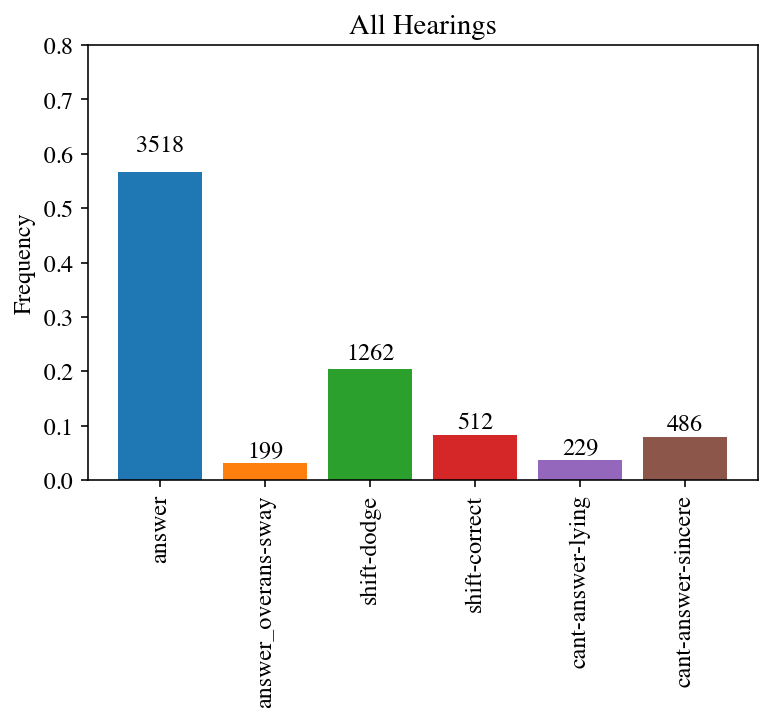

In [9]:
plot_freqs_counts_overall(gold_df, 'gold_coarse_labels', label_order, label_colors, hide_x_labels=False)

86195:Examining the IRS's 
[0.5888157894736842, 0.01644736842105263, 0.1611842105263158, 0.09539473684210527, 0.049342105263157895, 0.08881578947368421]
88494:Examining the Irs Re
[0.6394984326018809, 0.03134796238244514, 0.14106583072100312, 0.08463949843260188, 0.025078369905956112, 0.07836990595611286]
89598:IRS Obstruction: Loi
[0.7657657657657657, 0.04504504504504504, 0.09309309309309309, 0.057057057057057055, 0.009009009009009009, 0.03003003003003003]
93834:Examining The Justic
[0.7484472049689441, 0.0, 0.10248447204968944, 0.059006211180124224, 0.031055900621118012, 0.059006211180124224]
20722:Oversight of the Dep
[0.4, 0.020338983050847456, 0.3016949152542373, 0.13220338983050847, 0.013559322033898305, 0.13220338983050847]
22125:Oversight of the Fed
[0.5226480836236934, 0.013937282229965157, 0.06620209059233449, 0.05574912891986063, 0.11149825783972125, 0.22996515679442509]
26003:Holding Wall Street 
[0.3903225806451613, 0.08387096774193549, 0.4129032258064516, 0.04193548387096

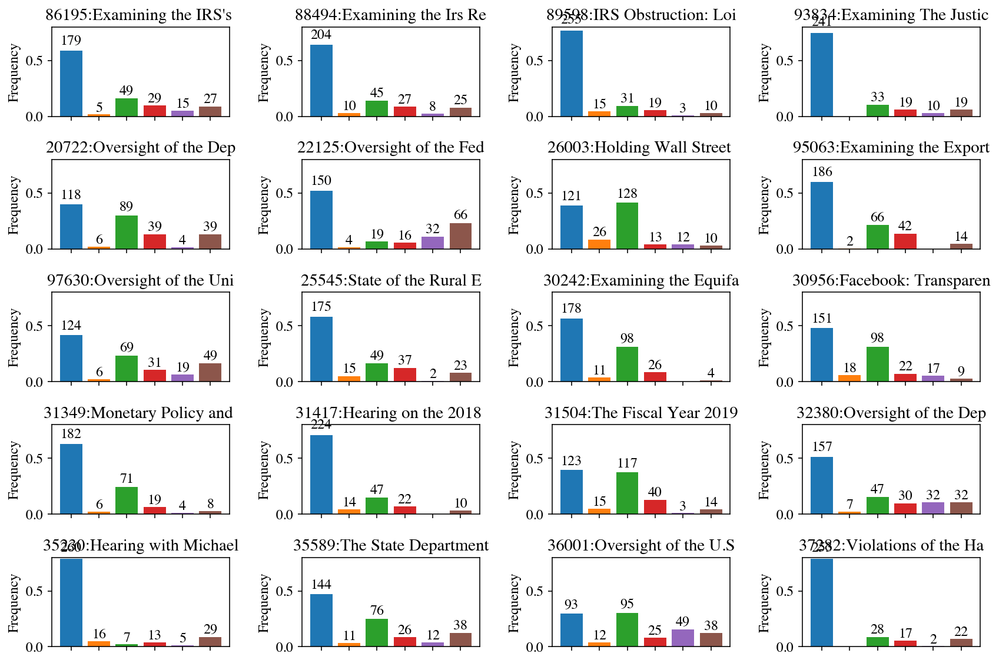

In [10]:
plot_freqs_counts(gold_df, 'gold_coarse_labels', label_order, label_colors, hide_x_labels=True)

### Label sets

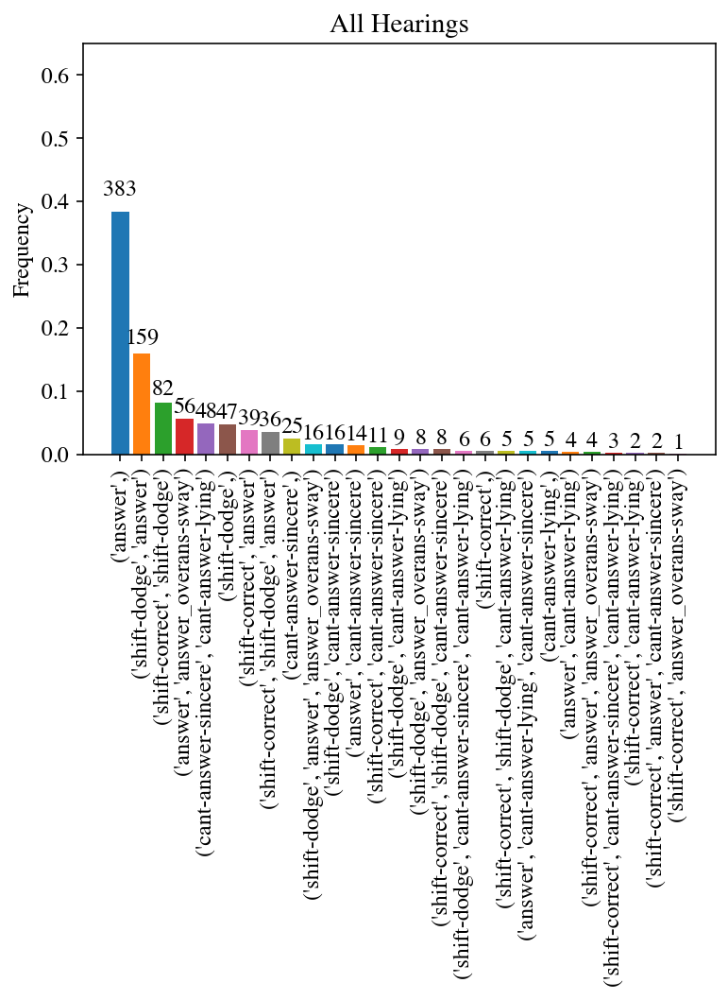

In [11]:
plot_freqs_counts_df_overall(gold_df, 'gold_label_set', label_set_order, label_set_colors, hide_x_labels=False)

In [12]:
counts_dict = collections.Counter(list(chain.from_iterable(gold_df['gold_label_set'].values)))


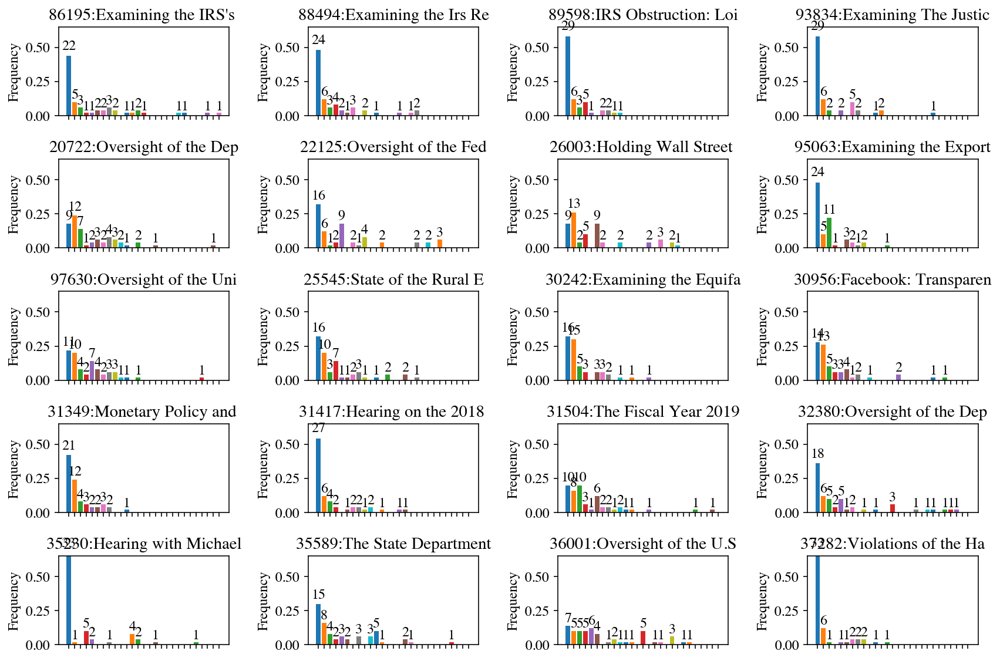

In [13]:
plot_freqs_counts_df(gold_df, 'gold_label_set', label_set_order, label_set_colors)

## Conversational acts

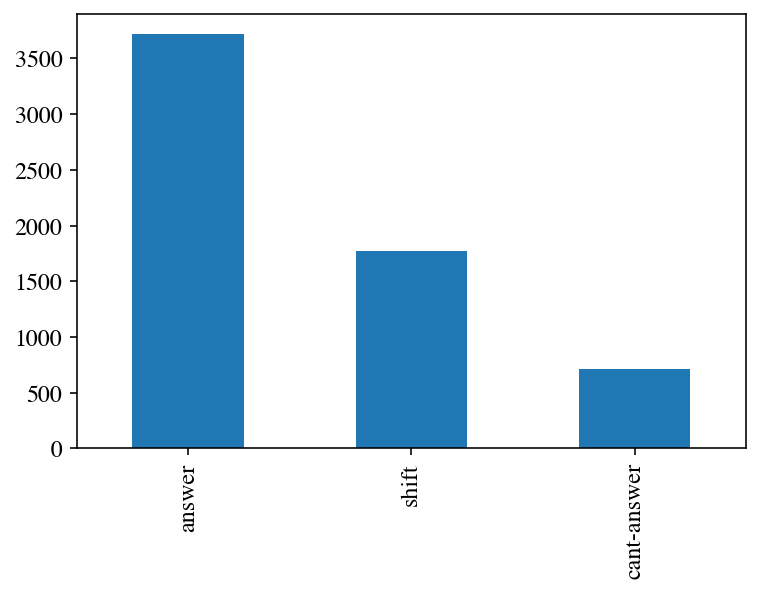

In [14]:
expanded_df['gold_act'].value_counts().plot(kind='bar')

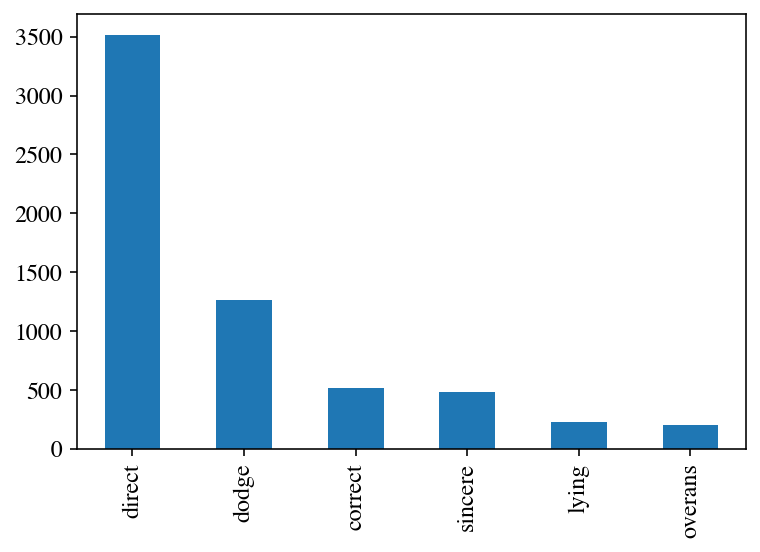

In [15]:
expanded_df['gold_intent'].value_counts().plot(kind='bar')

## Q1: Is there disagreement?

In [16]:
unambiguous_df = gold_df[gold_df['gold_label_set'].str.len()==1]
disagree_df = gold_df[gold_df['gold_label_set'].str.len()>1]
two_disagree_df = gold_df[gold_df['gold_label_set'].str.len()==2]
three_disagree_df = gold_df[gold_df['gold_label_set'].str.len()==3]

label_set_disagree_order = disagree_df['gold_label_set'].value_counts(sort=True).index

Response Label Disagreements
[0.466, 0.449, 0.085]


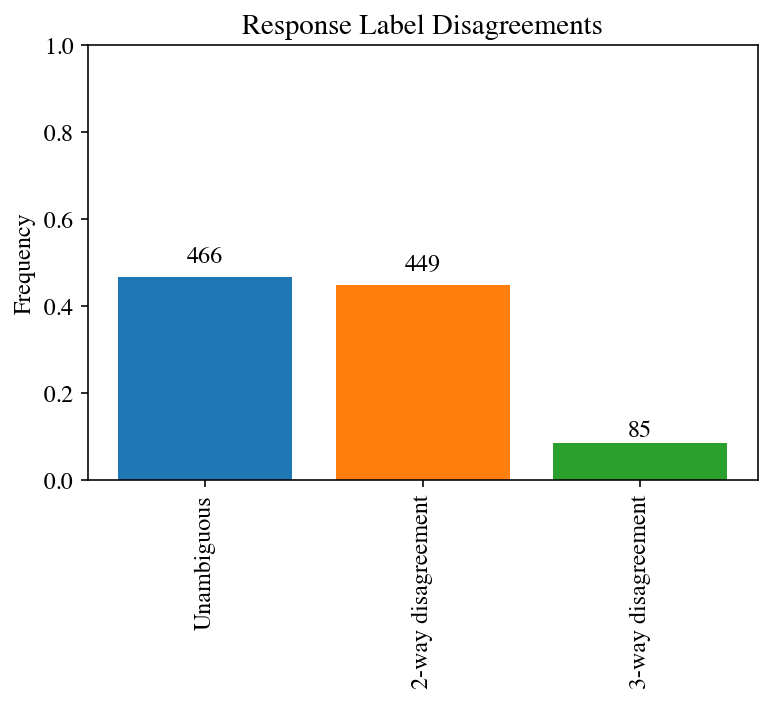

In [17]:
modes_dict = {'Unambiguous': len(unambiguous_df), '2-way disagreement': len(two_disagree_df),
              '3-way disagreement': len(three_disagree_df)}
plot_freqs_counts_dict(modes_dict, 'Response Label Disagreements', modes_dict.keys(), label_colors)

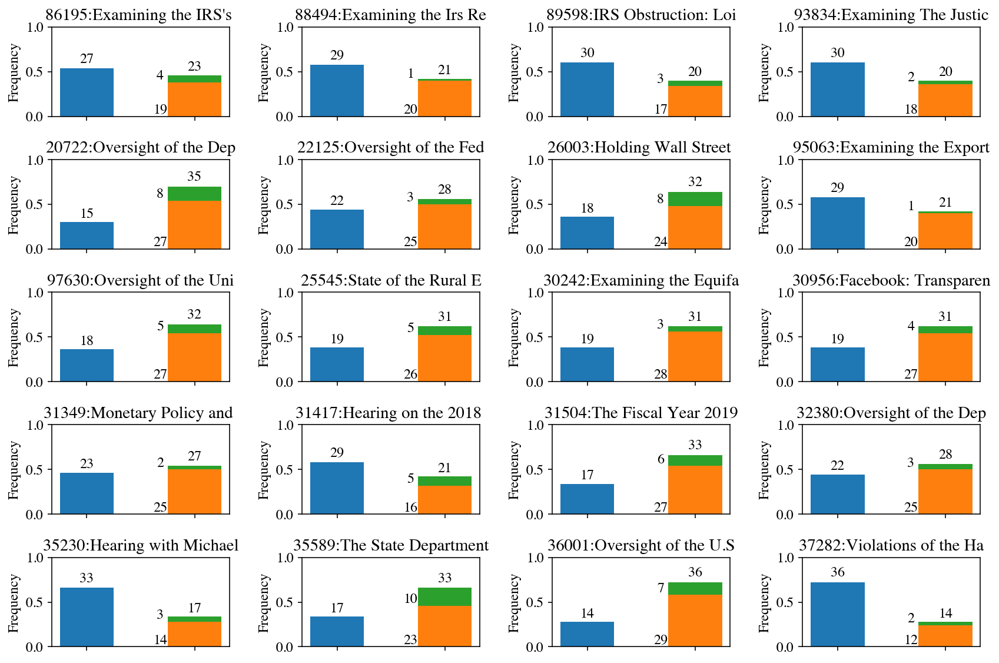

In [18]:
y_lim=1.0
hide_x_labels=False
column='gold_label_set'
n_hearings = len(gold_df['hearing_id'].unique())
n_cols=4
n_rows=math.ceil(n_hearings / n_cols)
fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(12, 8))
grouped = gold_df.groupby(['hearing_id'])
row_idx, col_idx = 0, 0
for name, group in grouped:
    plot_title = name[-5:]+':'+group['hearing_title'].unique()[0][:20]
    g_unambiguous_df = group[group[column].str.len()==1]
    g_two_disagree_df = group[group[column].str.len()==2]
    g_three_disagree_df = group[group[column].str.len()==3]
    g_modes_dict = {'Unambiguous': len(g_unambiguous_df), '2-way': len(g_two_disagree_df),
                   '3-way': len(g_three_disagree_df)}
    subplot_freqs_counts_stacked(g_modes_dict, axes[row_idx, col_idx], plot_title, g_modes_dict.keys(), label_colors, y_lim, hide_x_labels=True)
    # increment counters
    col_idx += 1
    if col_idx >= n_cols:
        col_idx = 0
        row_idx += 1
fig.tight_layout()
plt.show()
    

### Unambiguous: No disagreement

All Hearings
[0.8218884120171673, 0.0, 0.10085836909871244, 0.012875536480686695, 0.01072961373390558, 0.0536480686695279]


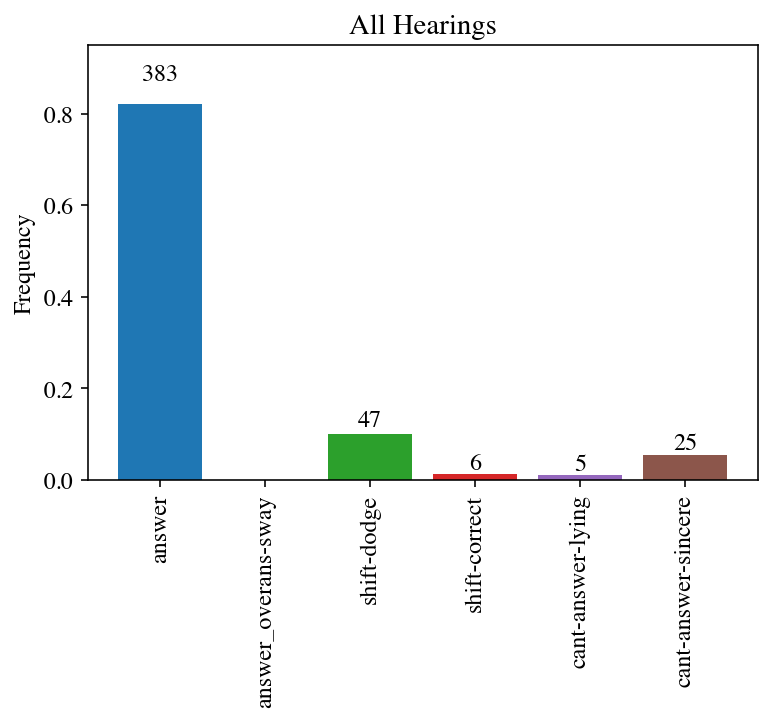

In [19]:
plot_freqs_counts_overall(unambiguous_df, 'gold_label_set', label_order, label_colors, y_lim=0.95, hide_x_labels=False)

86195:Examining the IRS's 
[0.8148148148148148, 0.0, 0.07407407407407407, 0.0, 0.037037037037037035, 0.07407407407407407]
88494:Examining the Irs Re
[0.8275862068965517, 0.0, 0.034482758620689655, 0.06896551724137931, 0.0, 0.06896551724137931]
89598:IRS Obstruction: Loi
[0.9666666666666667, 0.0, 0.0, 0.0, 0.0, 0.03333333333333333]
93834:Examining The Justic
[0.9666666666666667, 0.0, 0.0, 0.0, 0.03333333333333333, 0.0]
20722:Oversight of the Dep
[0.6, 0.0, 0.2, 0.0, 0.0, 0.2]
22125:Oversight of the Fed
[0.7272727272727273, 0.0, 0.0, 0.09090909090909091, 0.0, 0.18181818181818182]
26003:Holding Wall Street 
[0.5, 0.0, 0.5, 0.0, 0.0, 0.0]
95063:Examining the Export
[0.8275862068965517, 0.0, 0.10344827586206896, 0.0, 0.0, 0.06896551724137931]
97630:Oversight of the Uni
[0.6111111111111112, 0.0, 0.2222222222222222, 0.0, 0.0, 0.16666666666666666]
25545:State of the Rural E
[0.8421052631578947, 0.0, 0.05263157894736842, 0.05263157894736842, 0.0, 0.05263157894736842]
30242:Examining the Equifa


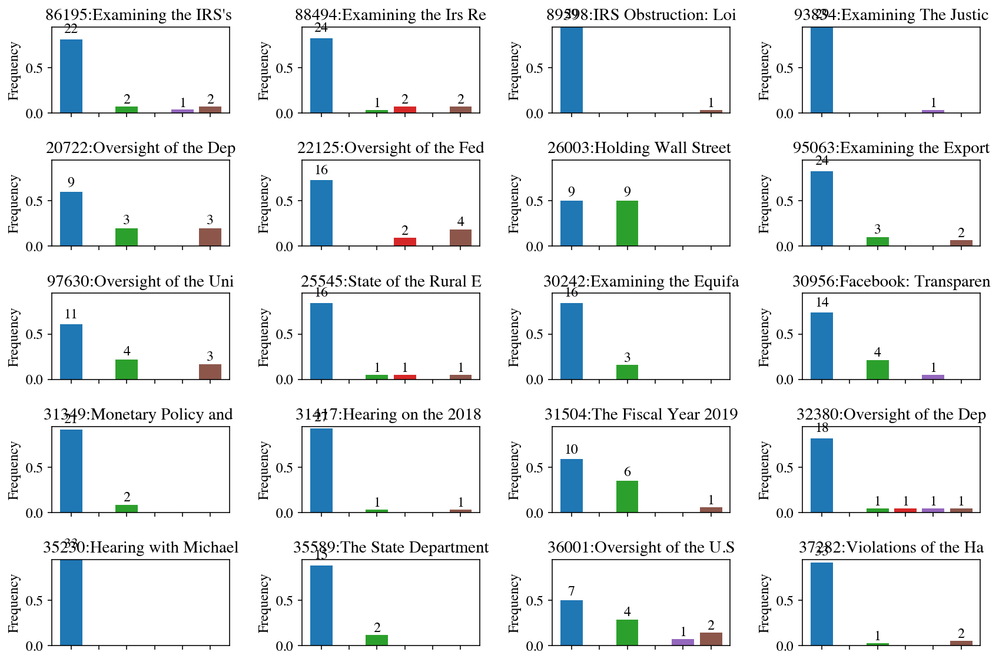

In [20]:
plot_freqs_counts(unambiguous_df, 'gold_label_set', label_order, label_colors, y_lim=0.95)

### Any disagreement (>1)

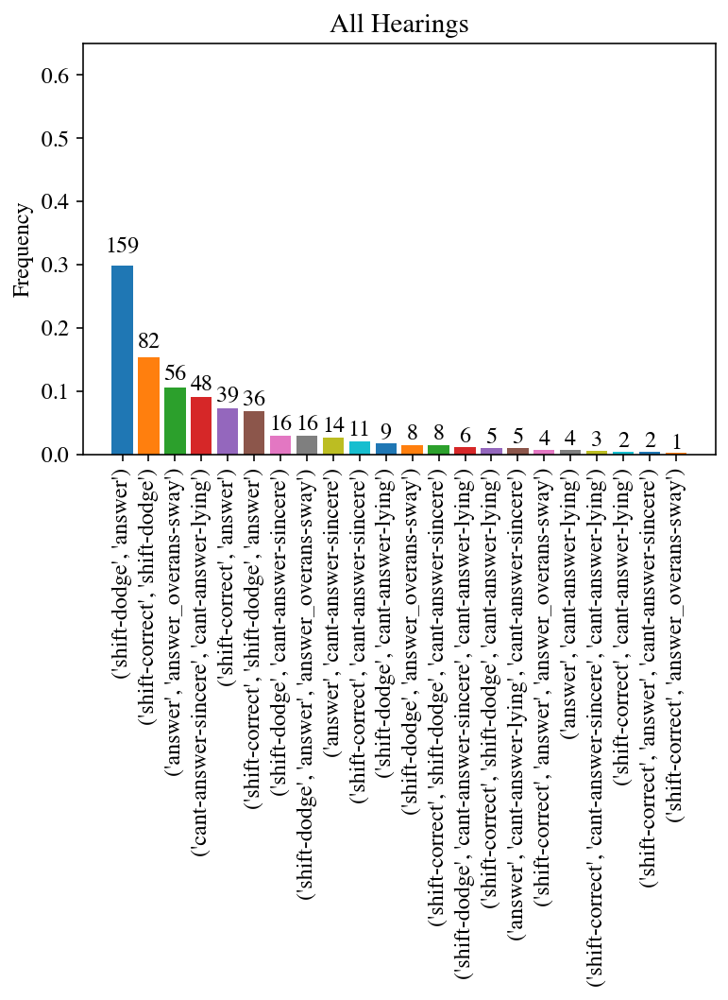

In [21]:
plot_freqs_counts_df_overall(disagree_df, 'gold_label_set', label_set_disagree_order, label_set_colors, hide_x_labels=False)

All Hearings
[0.29054640069384213, 0.07372072853425846, 0.2992194275802255, 0.1673894189071986, 0.07111882046834345, 0.09800520381613183]


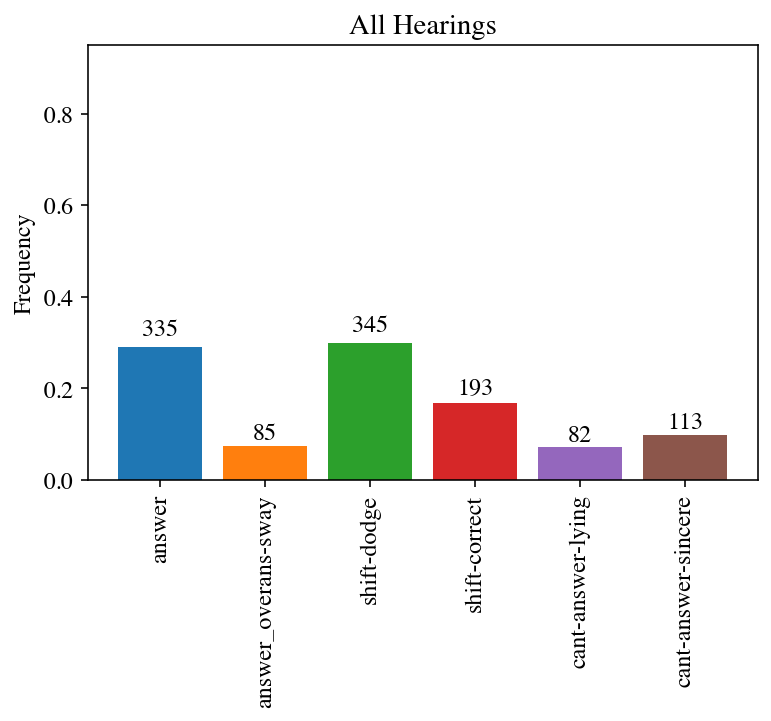

In [22]:
plot_freqs_counts_overall(disagree_df, 'gold_label_set', label_order, label_colors, y_lim=0.95, hide_x_labels=False)

86195:Examining the IRS's 
[0.26, 0.04, 0.26, 0.24, 0.08, 0.12]
88494:Examining the Irs Re
[0.3023255813953488, 0.11627906976744186, 0.27906976744186046, 0.13953488372093023, 0.06976744186046512, 0.09302325581395349]
89598:IRS Obstruction: Loi
[0.37209302325581395, 0.13953488372093023, 0.27906976744186046, 0.16279069767441862, 0.023255813953488372, 0.023255813953488372]
93834:Examining The Justic
[0.35714285714285715, 0.0, 0.2619047619047619, 0.21428571428571427, 0.047619047619047616, 0.11904761904761904]
20722:Oversight of the Dep
[0.28205128205128205, 0.038461538461538464, 0.34615384615384615, 0.21794871794871795, 0.02564102564102564, 0.08974358974358974]
22125:Oversight of the Fed
[0.3050847457627119, 0.03389830508474576, 0.13559322033898305, 0.06779661016949153, 0.23728813559322035, 0.22033898305084745]
26003:Holding Wall Street 
[0.3194444444444444, 0.125, 0.3333333333333333, 0.08333333333333333, 0.08333333333333333, 0.05555555555555555]
95063:Examining the Export
[0.2093023255813

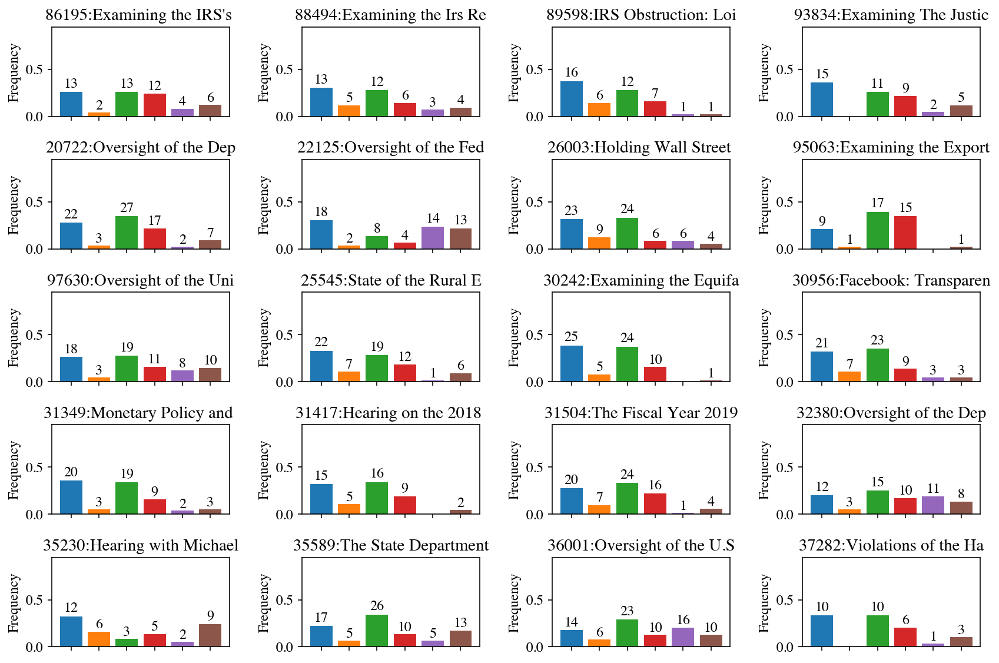

In [23]:
plot_freqs_counts(disagree_df, 'gold_label_set', label_order, label_colors, y_lim=0.95)

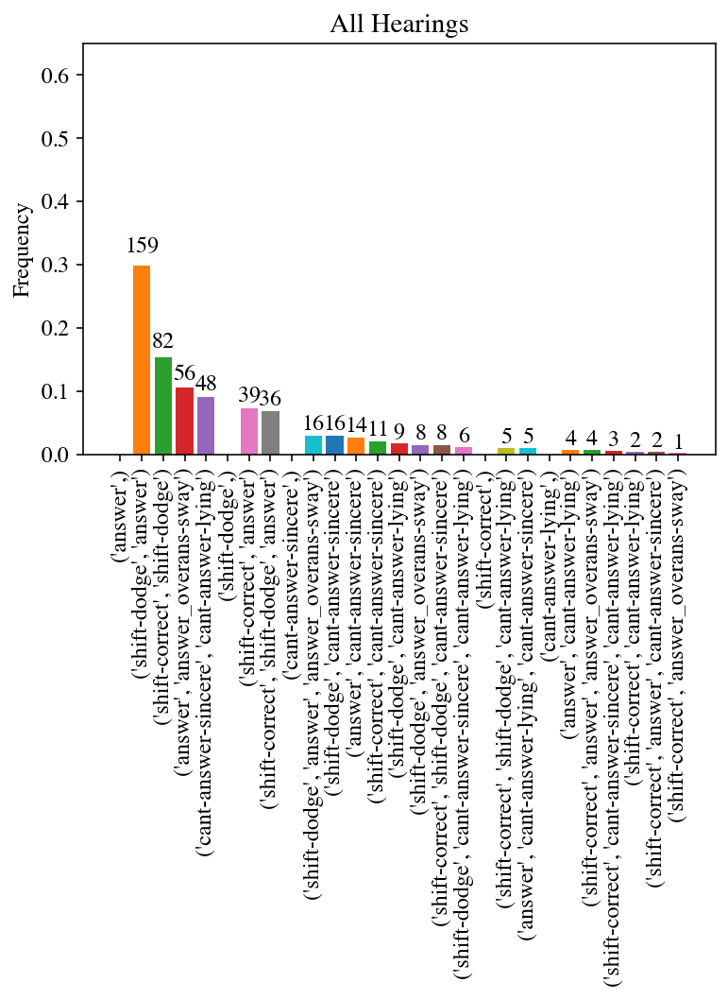

In [24]:
plot_freqs_counts_df_overall(disagree_df, 'gold_label_set', label_set_order, label_set_colors, hide_x_labels=False)

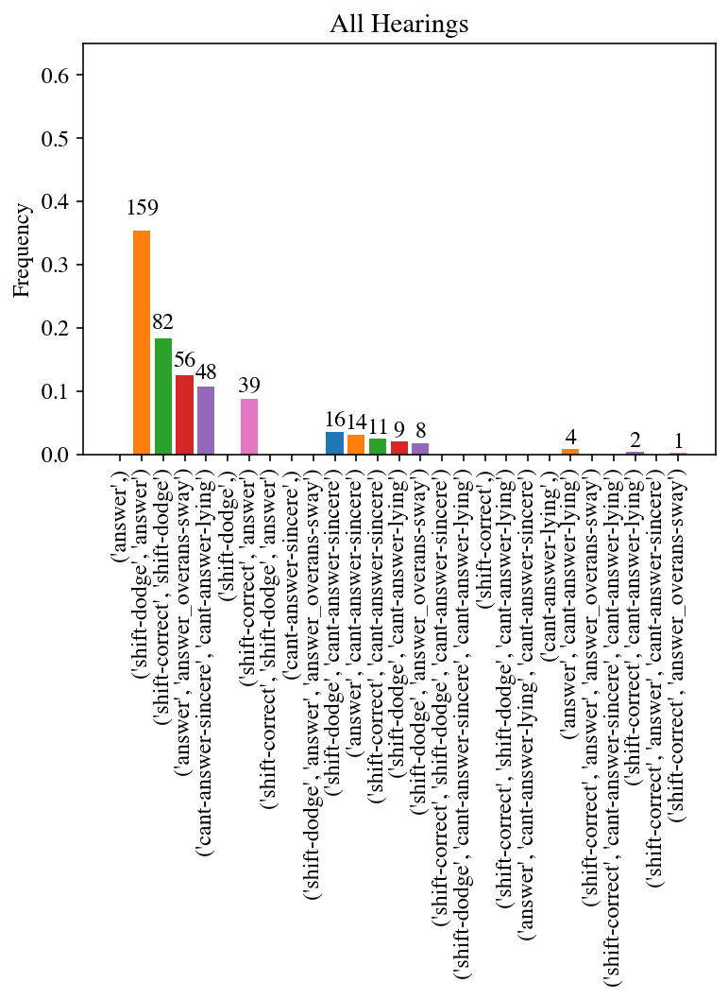

In [25]:
plot_freqs_counts_df_overall(two_disagree_df, 'gold_label_set', label_set_order, label_set_colors, hide_x_labels=False)

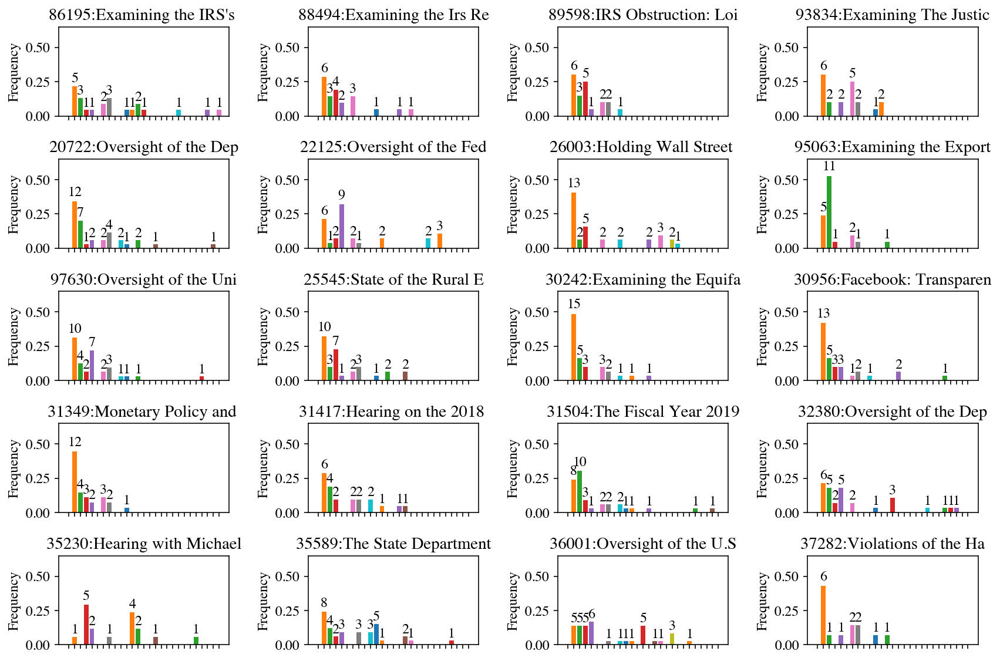

In [26]:
plot_freqs_counts_df(disagree_df, 'gold_label_set', label_set_order, label_set_colors)

### Two way: Some disagreement

All Hearings
[0.3028953229398664, 0.07238307349665925, 0.3051224944320713, 0.15033407572383073, 0.07015590200445435, 0.09910913140311804]


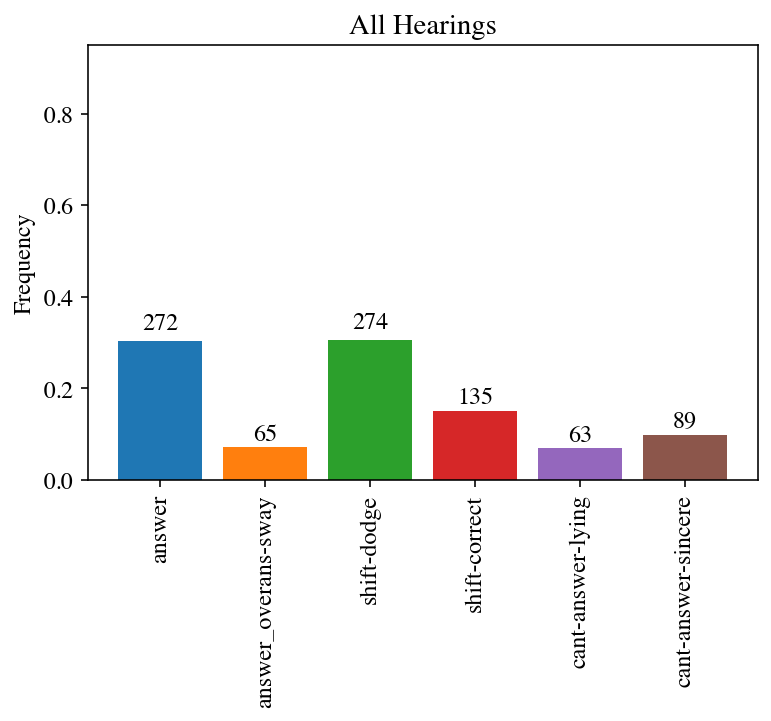

In [27]:
plot_freqs_counts_overall(two_disagree_df, 'gold_label_set', label_order, label_colors, y_lim=0.95, hide_x_labels=False)

86195:Examining the IRS's 
[0.23684210526315788, 0.05263157894736842, 0.2631578947368421, 0.23684210526315788, 0.07894736842105263, 0.13157894736842105]
88494:Examining the Irs Re
[0.325, 0.125, 0.275, 0.15, 0.05, 0.075]
89598:IRS Obstruction: Loi
[0.38235294117647056, 0.14705882352941177, 0.2647058823529412, 0.14705882352941177, 0.029411764705882353, 0.029411764705882353]
93834:Examining The Justic
[0.3611111111111111, 0.0, 0.25, 0.19444444444444445, 0.05555555555555555, 0.1388888888888889]
20722:Oversight of the Dep
[0.2777777777777778, 0.018518518518518517, 0.37037037037037035, 0.2037037037037037, 0.037037037037037035, 0.09259259259259259]
22125:Oversight of the Fed
[0.3, 0.04, 0.14, 0.06, 0.24, 0.22]
26003:Holding Wall Street 
[0.4166666666666667, 0.14583333333333334, 0.3541666666666667, 0.08333333333333333, 0.0, 0.0]
95063:Examining the Export
[0.2, 0.025, 0.4, 0.35, 0.0, 0.025]
97630:Oversight of the Uni
[0.25925925925925924, 0.037037037037037035, 0.2777777777777778, 0.1296296296

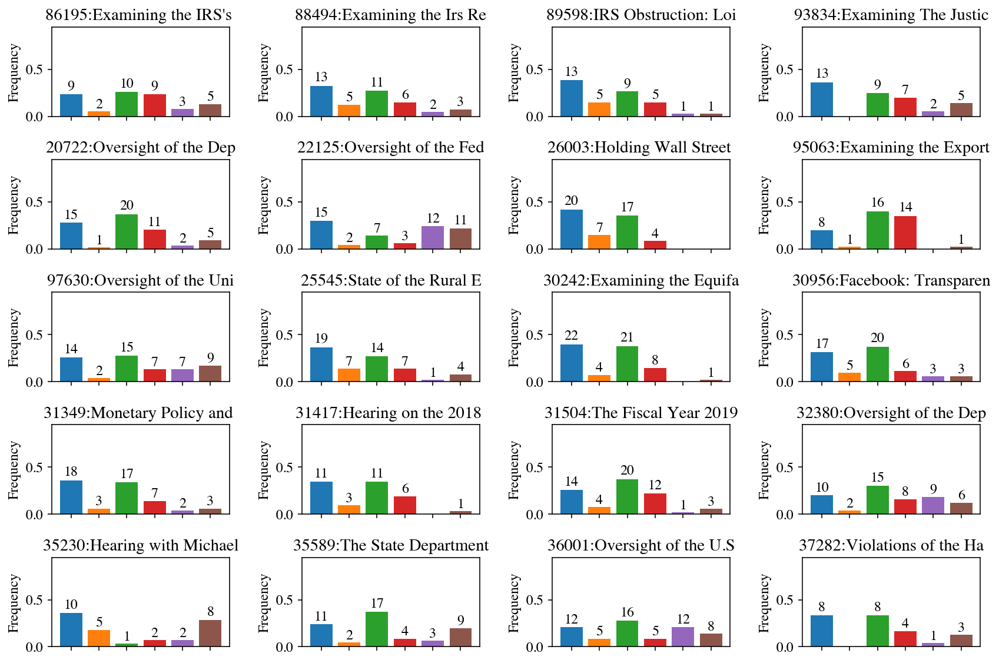

In [28]:
plot_freqs_counts(two_disagree_df, 'gold_label_set', label_order, label_colors, y_lim=0.95)

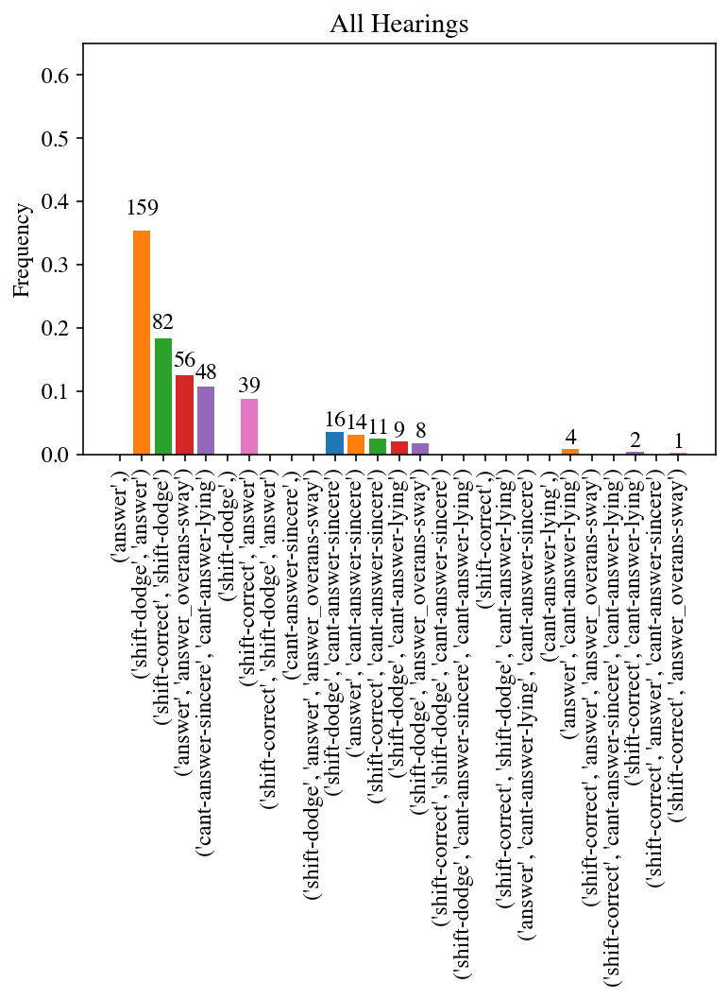

In [29]:
plot_freqs_counts_df_overall(two_disagree_df, 'gold_label_set', label_set_order, label_set_colors, hide_x_labels=False)

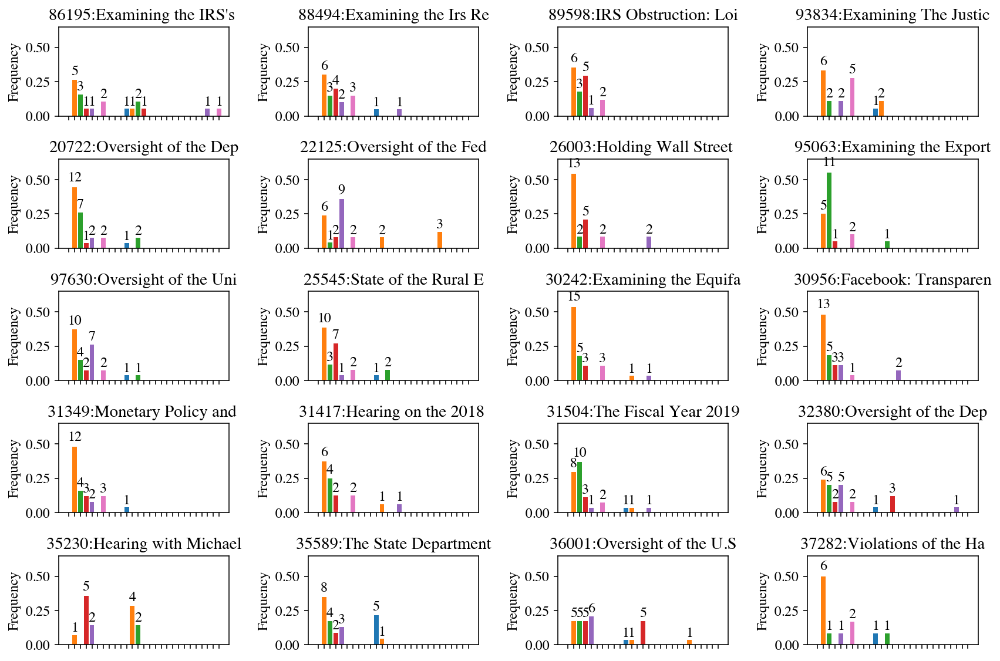

In [30]:
plot_freqs_counts_df(two_disagree_df, 'gold_label_set', label_set_order, label_set_colors)

### Three way: Lots of disagreement

All Hearings
[0.24705882352941178, 0.0784313725490196, 0.2784313725490196, 0.22745098039215686, 0.07450980392156863, 0.09411764705882353]


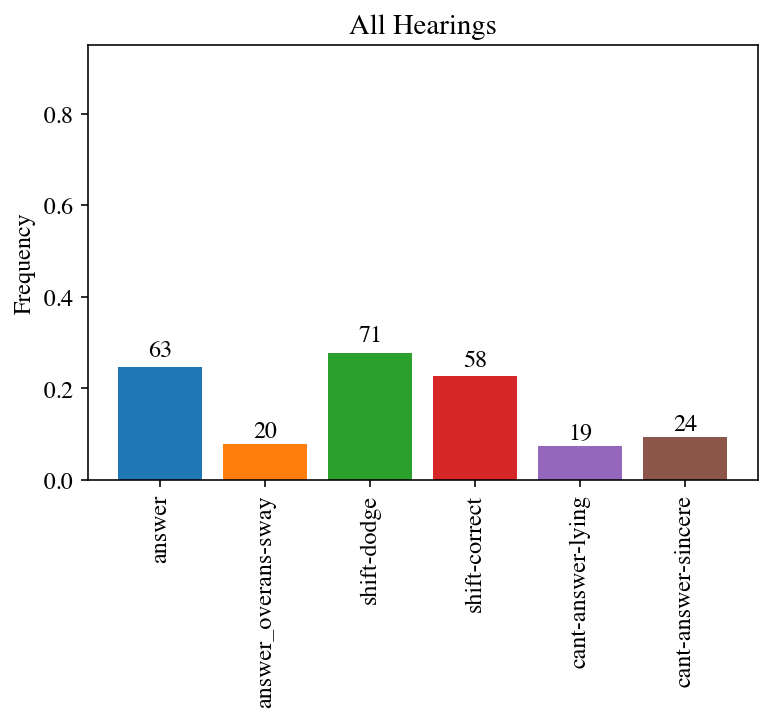

In [31]:
plot_freqs_counts_overall(three_disagree_df, 'gold_label_set', label_order, label_colors, y_lim=0.95, hide_x_labels=False)

86195:Examining the IRS's 
[0.3333333333333333, 0.0, 0.25, 0.25, 0.08333333333333333, 0.08333333333333333]
88494:Examining the Irs Re
[0.0, 0.0, 0.3333333333333333, 0.0, 0.3333333333333333, 0.3333333333333333]
89598:IRS Obstruction: Loi
[0.3333333333333333, 0.1111111111111111, 0.3333333333333333, 0.2222222222222222, 0.0, 0.0]
93834:Examining The Justic
[0.3333333333333333, 0.0, 0.3333333333333333, 0.3333333333333333, 0.0, 0.0]
20722:Oversight of the Dep
[0.2916666666666667, 0.08333333333333333, 0.2916666666666667, 0.25, 0.0, 0.08333333333333333]
22125:Oversight of the Fed
[0.3333333333333333, 0.0, 0.1111111111111111, 0.1111111111111111, 0.2222222222222222, 0.2222222222222222]
26003:Holding Wall Street 
[0.125, 0.08333333333333333, 0.2916666666666667, 0.08333333333333333, 0.25, 0.16666666666666666]
95063:Examining the Export
[0.3333333333333333, 0.0, 0.3333333333333333, 0.3333333333333333, 0.0, 0.0]
97630:Oversight of the Uni
[0.26666666666666666, 0.06666666666666667, 0.2666666666666666

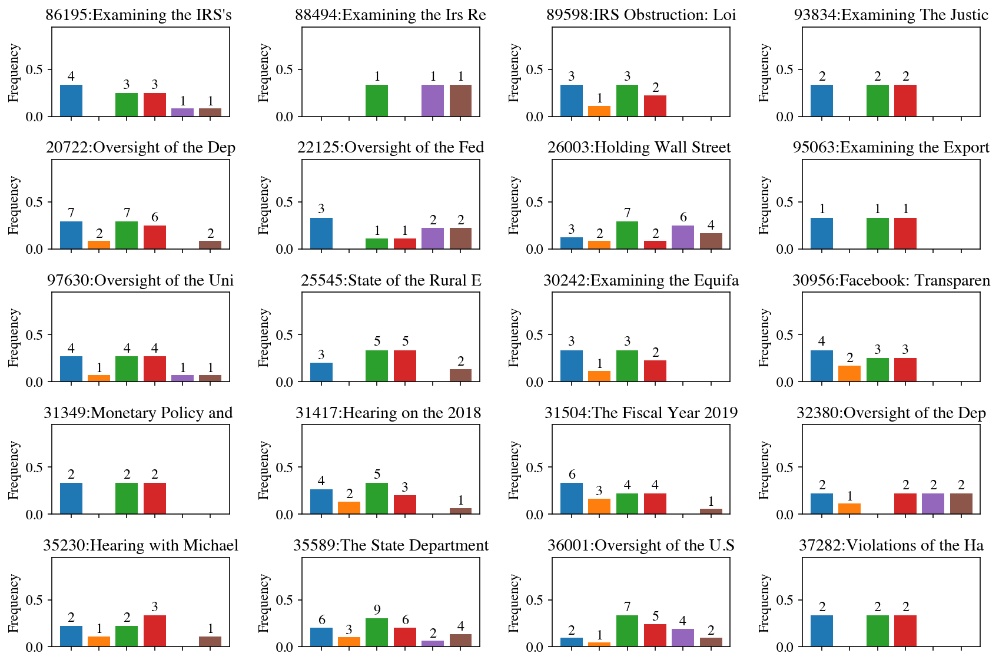

In [32]:
plot_freqs_counts(three_disagree_df, 'gold_label_set', label_order, label_colors, y_lim=0.95)

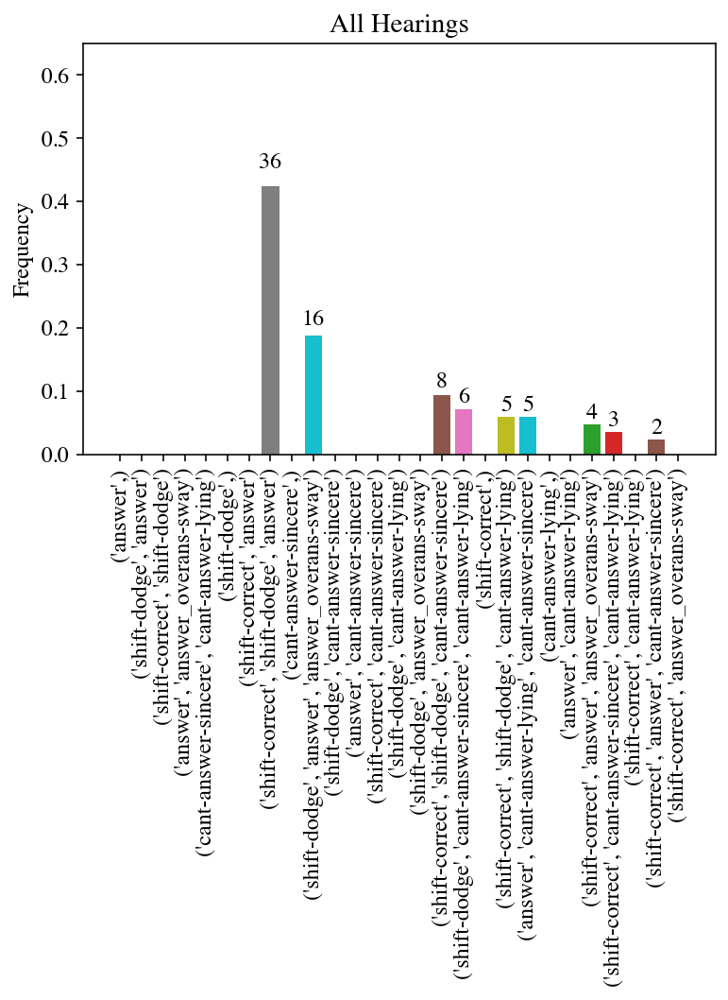

In [33]:
plot_freqs_counts_df_overall(three_disagree_df, 'gold_label_set', label_set_order, label_set_colors, hide_x_labels=False)

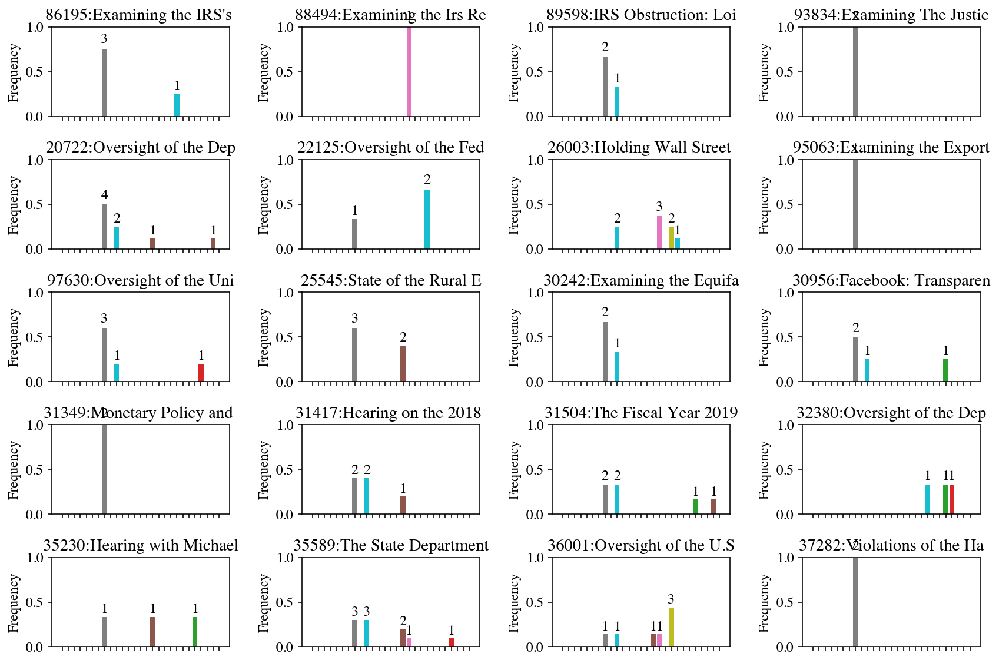

In [34]:
plot_freqs_counts_df(three_disagree_df, 'gold_label_set', label_set_order, label_set_colors, y_lim=1)

### Disagreement over time

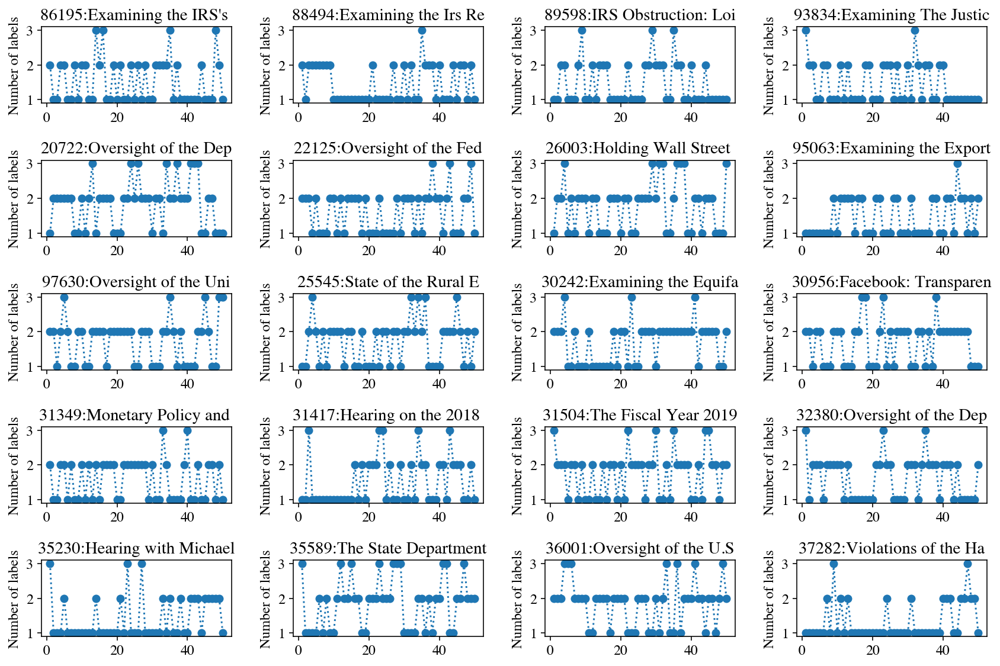

In [35]:
plot_disagreement_time(gold_df, 'gold_label_set')

In [36]:
from matplotlib.ticker import AutoMinorLocator
def subplot_scatter_sentiments(df, ax, plot_title):
    one_sided = []
    q_sentiments = df.groupby(['qa_index'])['gold_sentiment_num'].value_counts()
    y_labels = q_sentiments.index.levels[0]
    xs, ys, sizes, colors = [], [], [], []
    for y_idx, y_label in enumerate(y_labels):
        new_x = q_sentiments[y_label].index.values
        if np.all(new_x > 0) or np.all(new_x < 0) or np.all(new_x == 0):
            colors.extend(['r']*len(new_x))
            one_sided.append([new_x,q_sentiments[y_label].values])
        else:
            colors.extend(['b']*len(new_x))
        xs.extend(new_x)
        sizes.extend(q_sentiments[y_label].values*10)
        ys.extend([y_idx]*len(new_x))
    ax.set_title(plot_title)
    ax.scatter(xs,ys,s=sizes,alpha=0.3,color=colors)
    ax.yaxis.grid(True, linewidth=0.4, which='both',markevery=1)
    ax.yaxis.set_minor_locator(AutoMinorLocator(10))
    print(df['hearing_id'].unique())
    print('One sided', len(one_sided), one_sided)

['CHRG-113hhrg86195']
One sided 1 [[array([-1, -2]), array([2, 1])]]
['CHRG-113hhrg88494']
One sided 0 []
['CHRG-113hhrg89598']
One sided 0 []
['CHRG-113hhrg93834']
One sided 0 []
['CHRG-114hhrg20722']
One sided 0 []
['CHRG-114hhrg22125']
One sided 1 [[array([0]), array([3])]]
['CHRG-114hhrg26003']
One sided 0 []
['CHRG-114hhrg95063']
One sided 1 [[array([0]), array([4])]]
['CHRG-114hhrg97630']
One sided 1 [[array([-2, -1]), array([2, 2])]]
['CHRG-115hhrg25545']
One sided 0 []
['CHRG-115hhrg30242']
One sided 0 []
['CHRG-115hhrg30956']
One sided 0 []
['CHRG-115hhrg31349']
One sided 3 [[array([1, 2]), array([4, 1])], [array([1, 2]), array([5, 1])], [array([1, 2]), array([3, 1])]]
['CHRG-115hhrg31417']
One sided 0 []
['CHRG-115hhrg31504']
One sided 0 []
['CHRG-115hhrg32380']
One sided 0 []
['CHRG-116hhrg35230']
One sided 0 []
['CHRG-116hhrg35589']
One sided 0 []
['CHRG-116hhrg36001']
One sided 2 [[array([-3, -2, -1]), array([3, 2, 1])], [array([-3, -2, -1]), array([3, 2, 1])]]
['CHRG-116h

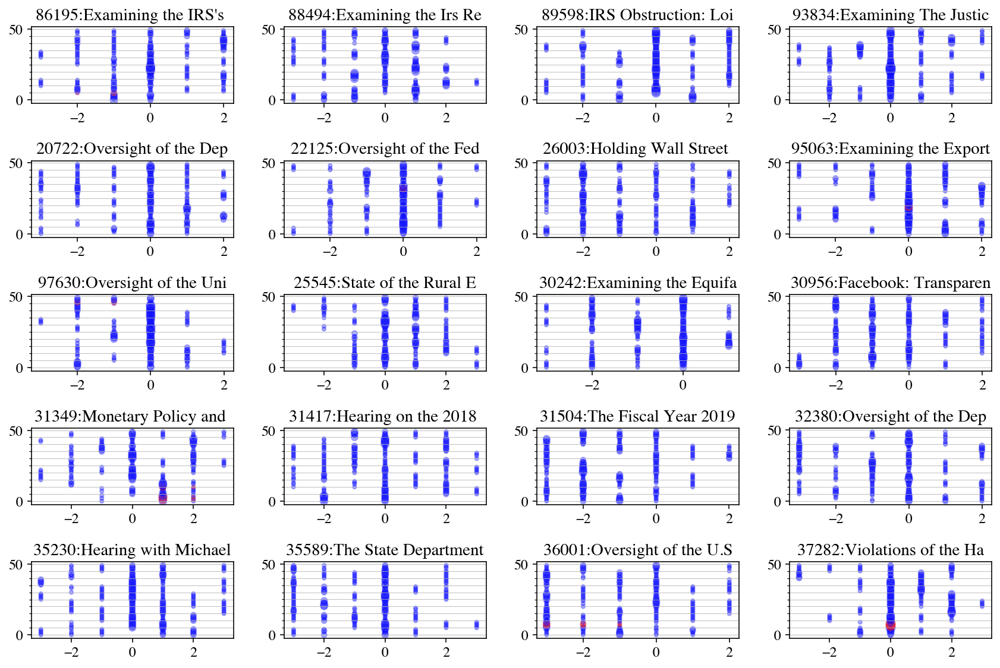

In [37]:
column='gold_sentiment'
n_hearings = len(expanded_df['hearing_id'].unique())
n_cols=4
n_rows=math.ceil(n_hearings / n_cols)
fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(12, 8))
grouped_h = expanded_df.groupby(['hearing_id'])
row_idx, col_idx = 0, 0
for name, group_h in grouped_h:
    plot_title = name[-5:]+':'+group_h['hearing_title'].unique()[0][:20]
    subplot_scatter_sentiments(group_h, axes[row_idx, col_idx], plot_title)
    
    # increment counters
    col_idx += 1
    if col_idx >= n_cols:
        col_idx = 0
        row_idx += 1
fig.tight_layout()
plt.show()
    

All Hearings
[0.08330647760232034, 0.1453432162423461, 0.14727682887528198, 0.3602964872703835, 0.1455043506284241, 0.10457621656461488, 0.013696422816629068]


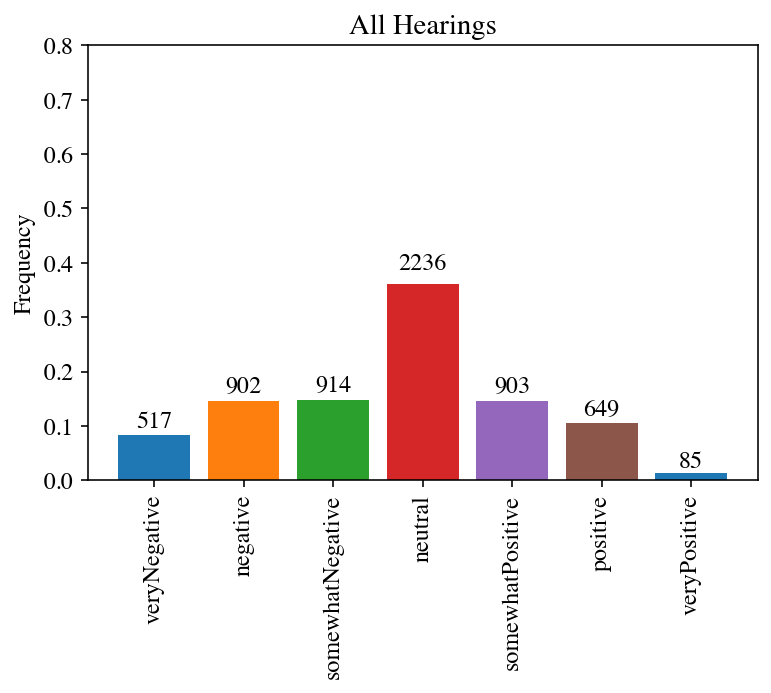

In [38]:
sent_order=['veryNegative','negative','somewhatNegative','neutral',
            'somewhatPositive', 'positive', 'veryPositive']
plot_freqs_counts_overall(gold_df, 'gold_sentiments', sent_order, label_colors, hide_x_labels=False)

86195:Examining the IRS's 
[0.03289473684210526, 0.12828947368421054, 0.20723684210526316, 0.35526315789473684, 0.10197368421052631, 0.17434210526315788, 0.0]
88494:Examining the Irs Re
[0.06583072100313479, 0.10344827586206896, 0.18808777429467086, 0.2664576802507837, 0.2727272727272727, 0.09090909090909091, 0.012539184952978056]
89598:IRS Obstruction: Loi
[0.04504504504504504, 0.12612612612612611, 0.1111111111111111, 0.42342342342342343, 0.12912912912912913, 0.16516516516516516, 0.0]
93834:Examining The Justic
[0.031055900621118012, 0.13043478260869565, 0.09937888198757763, 0.46273291925465837, 0.13043478260869565, 0.10248447204968944, 0.043478260869565216]
20722:Oversight of the Dep
[0.09491525423728814, 0.12203389830508475, 0.09830508474576272, 0.4033898305084746, 0.19661016949152543, 0.0847457627118644, 0.0]
22125:Oversight of the Fed
[0.027874564459930314, 0.12195121951219512, 0.17073170731707318, 0.5052264808362369, 0.14285714285714285, 0.0313588850174216, 0.0]
26003:Holding Wal

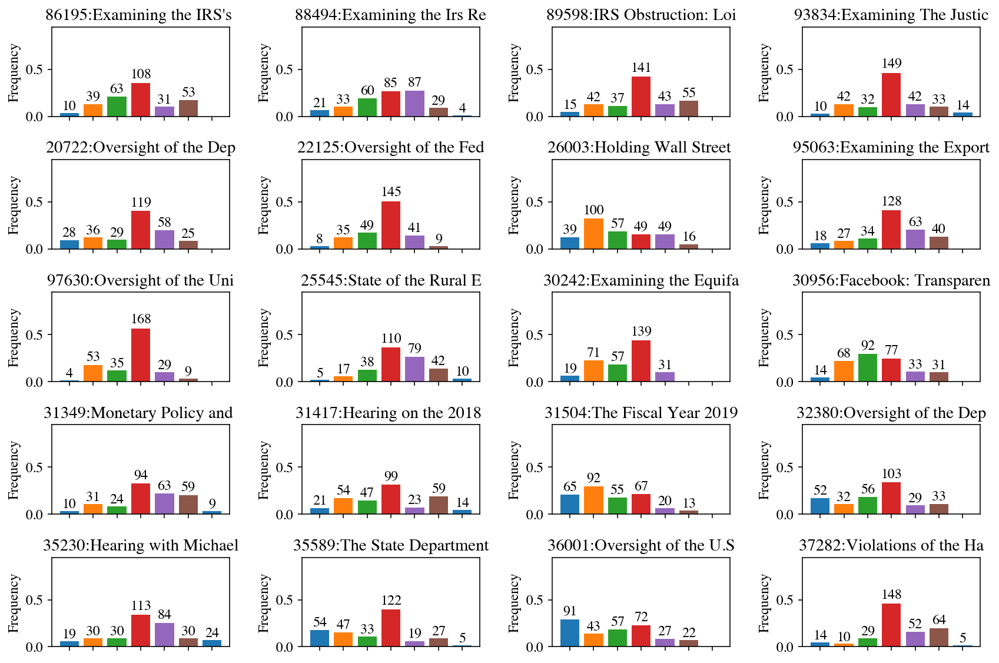

In [39]:
plot_freqs_counts(gold_df, 'gold_sentiments', sent_order, label_colors, y_lim=0.95)

## Q2: Is disagreement 'real'?

### 1. IAA

In [40]:
def calculate_iaa(df, intent_label, intent_code_dict):
    intent_agreement = pd.DataFrame(columns=df['qa_index'].unique(),index=list(set(chain.from_iterable(df['gold_workers'].values))))
    for item in intent_agreement.columns:
        labels, workers = df[df['qa_index']==item][[intent_label,'gold_workers']].values[0]
        for label, worker in zip(labels, workers):
            intent_agreement.loc[worker,item] = intent_code_dict[label]
    print(" #workers, #items:",intent_agreement.shape)
    intent_agreement = intent_agreement.fillna('*')
    intent_agreement_array = intent_agreement.to_numpy()
    missing = "*"
    return(k.krippendorff_alpha(intent_agreement_array, k.nominal_metric, missing_items=missing))
    
def calculate_iaa_sentiment(df, intent_label, intent_code_dict, sentiment_labels):
    missing = "*"
    for sentiment_label in sentiment_labels:
        mask = df['gold_sentiments'].apply(lambda x: sentiment_label in x)
        df_sentiment = df[mask]
        intent_agreement = pd.DataFrame(columns=df_sentiment['qa_index'].unique())
        for item in intent_agreement.columns:
            sentiments, workers, intents = df_sentiment[df_sentiment['qa_index']==item][['gold_sentiments','gold_workers',intent_label]].values[0]
            for sentiment, worker, intent in zip(sentiments, workers, intents):
                if sentiment==sentiment_label:
                    intent_agreement.loc[worker, item] = intent_code_dict[intent]
        intent_agreement.dropna(how='all', axis=0, inplace=True)
        intent_agreement = intent_agreement.fillna('*')
        intent_agreement_array = intent_agreement.to_numpy()
        print("Processing sentiment ", sentiment_label," #workers, #items:",intent_agreement.shape)
        try:
            print(k.krippendorff_alpha(intent_agreement_array, k.nominal_metric, missing_items=missing))
        except ValueError as e1:
            print("Caught ValueError exception: ", e1)
        except Exception as e2:
            print("Caught other exception: ", e2)
            
def calculate_iaa_sentiment_coarse(df, intent_label, intent_code_dict):
    missing = "*"
    sentiment_coarse_to_fine = {'negative':['veryNegative','negative','somewhatNegative'],
                                'neutral':['neutral'],
                                'positive':['somewhatPositive', 'positive', 'veryPositive']}
    for sentiment_group, sentiment_labels in sentiment_coarse_to_fine.items():
        mask = df['gold_sentiments'].apply(lambda x: any(item for item in sentiment_labels if item in x))
        df_sentiment = df[mask]
        intent_agreement = pd.DataFrame(columns=df_sentiment['qa_index'].unique())
        for item in intent_agreement.columns:
            sentiments, workers, intents = df_sentiment[df_sentiment['qa_index']==item][['gold_sentiments','gold_workers',intent_label]].values[0]
            for sentiment, worker, intent in zip(sentiments, workers, intents):
                if sentiment in sentiment_labels:
                    intent_agreement.loc[worker, item] = intent_code_dict[intent]
        intent_agreement.dropna(how='all', axis=0, inplace=True)
        intent_agreement = intent_agreement.fillna('*')
        intent_agreement_array = intent_agreement.to_numpy()
        print("Processing sentiment group", sentiment_group," #workers, #items:",intent_agreement.shape)
        try:
            print(k.krippendorff_alpha(intent_agreement_array, k.nominal_metric, missing_items=missing))
        except ValueError as e1:
            print("Caught ValueError exception: ", e1)
        except Exception as e2:
            print("Caught other exception: ", e2)

#### Overall

In [41]:
act_intent_to_code = {'answer':0, 'answer_overans-sway':1, 
                 'shift-dodge':2, 'shift-correct':3,
                 'cant-answer-lying':4, 'cant-answer-sincere':5}
k_all = calculate_iaa(gold_df, 'gold_coarse_labels', act_intent_to_code)
print(k_all)

 #workers, #items: (68, 1000)
0.4943113680883192


In [42]:
act_to_code = {'answer':0, 'shift':1, 'cant-answer':2}
k_act_all = calculate_iaa(gold_df, 'gold_acts', act_to_code)
print(k_act_all)

 #workers, #items: (68, 1000)
0.6522376424462182


In [43]:
intent_to_code = {'direct':0, 'overans':1, 'dodge':2, 'correct':3, 
                  'lying':4, 'sincere':5}
k_intent_all = calculate_iaa(gold_df, 'gold_intents', intent_to_code)
print(k_intent_all)

 #workers, #items: (68, 1000)
0.4943113680883192


In [44]:
intent_binary_to_code = {0:0, 1:1}
k_intent_binary_all = calculate_iaa(gold_df, 'gold_intents_binary', intent_binary_to_code)
print(k_intent_binary_all)

 #workers, #items: (68, 1000)
0.37684738724290334


In [45]:
k_unambiguous = calculate_iaa(unambiguous_df, 'gold_coarse_labels', act_intent_to_code)
print(k_unambiguous)

 #workers, #items: (66, 466)
1.0


In [46]:
k_disagree = calculate_iaa(disagree_df, 'gold_coarse_labels', act_intent_to_code)
print(k_disagree)

 #workers, #items: (63, 534)
0.23274109232101559


In [47]:
k_act_disagree = calculate_iaa(disagree_df, 'gold_acts', act_to_code)
print(k_act_all)

 #workers, #items: (63, 534)
0.6522376424462182


In [48]:
k_intent_disagree = calculate_iaa(disagree_df, 'gold_intents', intent_to_code)
print(k_intent_disagree)

 #workers, #items: (63, 534)
0.23274109232101559


In [49]:
k_intent_binary_disagree = calculate_iaa(disagree_df, 'gold_intents_binary', intent_binary_to_code)
print(k_intent_binary_disagree)

 #workers, #items: (63, 534)
0.05801759083591995


In [50]:
k_two_disagree = calculate_iaa(two_disagree_df, 'gold_coarse_labels', act_intent_to_code)
print(k_two_disagree)

 #workers, #items: (60, 449)
0.27593286807404604


In [51]:
k_three_disagree = calculate_iaa(three_disagree_df, 'gold_coarse_labels', act_intent_to_code)
print(k_three_disagree)

 #workers, #items: (47, 85)
0.021572020021010108


#### By sentiment: fine-grained

In [52]:
sentiment_labels = ['veryNegative', 'negative', 'somewhatNegative',
                     'neutral',
                     'somewhatPositive', 'positive', 'veryPositive']

In [53]:
calculate_iaa_sentiment(gold_df, 'gold_coarse_labels', act_intent_to_code, sentiment_labels)

Processing sentiment  veryNegative  #workers, #items: (20, 404)
0.4142371551836841
Processing sentiment  negative  #workers, #items: (34, 614)
0.5382960380823869
Processing sentiment  somewhatNegative  #workers, #items: (36, 593)
0.49414101720467984
Processing sentiment  neutral  #workers, #items: (35, 945)
0.5058523009337543
Processing sentiment  somewhatPositive  #workers, #items: (38, 601)
0.4860357355809557
Processing sentiment  positive  #workers, #items: (21, 461)
0.5101156069364163
Processing sentiment  veryPositive  #workers, #items: (4, 85)
Caught ValueError exception:  No items to compare.


In [54]:
calculate_iaa_sentiment(disagree_df, 'gold_coarse_labels', act_intent_to_code, sentiment_labels)

Processing sentiment  veryNegative  #workers, #items: (19, 266)
0.22646443514644343
Processing sentiment  negative  #workers, #items: (34, 373)
0.2990799275041842
Processing sentiment  somewhatNegative  #workers, #items: (35, 334)
0.2243195785776999
Processing sentiment  neutral  #workers, #items: (31, 503)
0.274700840242872
Processing sentiment  somewhatPositive  #workers, #items: (36, 299)
0.2556227309088671
Processing sentiment  positive  #workers, #items: (20, 220)
0.22818791946308725
Processing sentiment  veryPositive  #workers, #items: (4, 33)
Caught ValueError exception:  No items to compare.


In [55]:
calculate_iaa_sentiment(two_disagree_df, 'gold_coarse_labels', act_intent_to_code, sentiment_labels)

Processing sentiment  veryNegative  #workers, #items: (19, 210)
0.2674990541051835
Processing sentiment  negative  #workers, #items: (33, 310)
0.3534314985495537
Processing sentiment  somewhatNegative  #workers, #items: (35, 272)
0.27223299240145293
Processing sentiment  neutral  #workers, #items: (29, 420)
0.32986708032484957
Processing sentiment  somewhatPositive  #workers, #items: (36, 252)
0.2858176555716353
Processing sentiment  positive  #workers, #items: (20, 180)
0.30101735487731895
Processing sentiment  veryPositive  #workers, #items: (4, 28)
Caught ValueError exception:  No items to compare.


In [56]:
calculate_iaa_sentiment(three_disagree_df, 'gold_coarse_labels', act_intent_to_code, sentiment_labels)

Processing sentiment  veryNegative  #workers, #items: (18, 56)
0.06919060052219328
Processing sentiment  negative  #workers, #items: (22, 63)
0.021746880570409965
Processing sentiment  somewhatNegative  #workers, #items: (25, 62)
-0.02124999999999999
Processing sentiment  neutral  #workers, #items: (22, 83)
0.004881869760352431
Processing sentiment  somewhatPositive  #workers, #items: (20, 47)
-0.00983606557377037
Processing sentiment  positive  #workers, #items: (12, 40)
-0.16666666666666652
Processing sentiment  veryPositive  #workers, #items: (3, 5)
Caught ValueError exception:  No items to compare.


In [57]:
calculate_iaa_sentiment(gold_df, 'gold_acts', act_to_code, sentiment_labels)

Processing sentiment  veryNegative  #workers, #items: (20, 404)
0.5399135446685879
Processing sentiment  negative  #workers, #items: (34, 614)
0.6960523412044188
Processing sentiment  somewhatNegative  #workers, #items: (36, 593)
0.6849361250385546
Processing sentiment  neutral  #workers, #items: (35, 945)
0.6540463849723775
Processing sentiment  somewhatPositive  #workers, #items: (38, 601)
0.6504899809858126
Processing sentiment  positive  #workers, #items: (21, 461)
0.6649961177384062
Processing sentiment  veryPositive  #workers, #items: (4, 85)
Caught ValueError exception:  No items to compare.


In [58]:
calculate_iaa_sentiment(disagree_df, 'gold_acts', act_to_code, sentiment_labels)

Processing sentiment  veryNegative  #workers, #items: (19, 266)
0.38306451612903214
Processing sentiment  negative  #workers, #items: (34, 373)
0.5041151599264113
Processing sentiment  somewhatNegative  #workers, #items: (35, 334)
0.47854785478547857
Processing sentiment  neutral  #workers, #items: (31, 503)
0.45725142355859794
Processing sentiment  somewhatPositive  #workers, #items: (36, 299)
0.45962390432186795
Processing sentiment  positive  #workers, #items: (20, 220)
0.42883046237533995
Processing sentiment  veryPositive  #workers, #items: (4, 33)
Caught ValueError exception:  No items to compare.


In [59]:
calculate_iaa_sentiment(two_disagree_df, 'gold_acts', act_to_code, sentiment_labels)

Processing sentiment  veryNegative  #workers, #items: (19, 210)
0.41839080459770117
Processing sentiment  negative  #workers, #items: (33, 310)
0.5856668601968054
Processing sentiment  somewhatNegative  #workers, #items: (35, 272)
0.5136719820264124
Processing sentiment  neutral  #workers, #items: (29, 420)
0.5396386610404742
Processing sentiment  somewhatPositive  #workers, #items: (36, 252)
0.5062611806797854
Processing sentiment  positive  #workers, #items: (20, 180)
0.4859154929577465
Processing sentiment  veryPositive  #workers, #items: (4, 28)
Caught ValueError exception:  No items to compare.


In [60]:
calculate_iaa_sentiment(three_disagree_df, 'gold_acts', act_to_code, sentiment_labels)

Processing sentiment  veryNegative  #workers, #items: (18, 56)
0.25075528700906347
Processing sentiment  negative  #workers, #items: (22, 63)
0.06130268199233724
Processing sentiment  somewhatNegative  #workers, #items: (25, 62)
0.26752336448598124
Processing sentiment  neutral  #workers, #items: (22, 83)
0.04945970978697112
Processing sentiment  somewhatPositive  #workers, #items: (20, 47)
0.10400000000000009
Processing sentiment  positive  #workers, #items: (12, 40)
0.08571428571428563
Processing sentiment  veryPositive  #workers, #items: (3, 5)
Caught ValueError exception:  No items to compare.


In [61]:
calculate_iaa_sentiment(gold_df, 'gold_intents', intent_to_code, sentiment_labels)

Processing sentiment  veryNegative  #workers, #items: (20, 404)
0.4142371551836841
Processing sentiment  negative  #workers, #items: (34, 614)
0.5382960380823869
Processing sentiment  somewhatNegative  #workers, #items: (36, 593)
0.49414101720467984
Processing sentiment  neutral  #workers, #items: (35, 945)
0.5058523009337543
Processing sentiment  somewhatPositive  #workers, #items: (38, 601)
0.4860357355809557
Processing sentiment  positive  #workers, #items: (21, 461)
0.5101156069364163
Processing sentiment  veryPositive  #workers, #items: (4, 85)
Caught ValueError exception:  No items to compare.


In [62]:
calculate_iaa_sentiment(disagree_df, 'gold_intents', intent_to_code, sentiment_labels)

Processing sentiment  veryNegative  #workers, #items: (19, 266)
0.22646443514644343
Processing sentiment  negative  #workers, #items: (34, 373)
0.2990799275041842
Processing sentiment  somewhatNegative  #workers, #items: (35, 334)
0.2243195785776999
Processing sentiment  neutral  #workers, #items: (31, 503)
0.274700840242872
Processing sentiment  somewhatPositive  #workers, #items: (36, 299)
0.2556227309088671
Processing sentiment  positive  #workers, #items: (20, 220)
0.22818791946308725
Processing sentiment  veryPositive  #workers, #items: (4, 33)
Caught ValueError exception:  No items to compare.


In [63]:
calculate_iaa_sentiment(two_disagree_df, 'gold_intents', intent_to_code, sentiment_labels)

Processing sentiment  veryNegative  #workers, #items: (19, 210)
0.2674990541051835
Processing sentiment  negative  #workers, #items: (33, 310)
0.3534314985495537
Processing sentiment  somewhatNegative  #workers, #items: (35, 272)
0.27223299240145293
Processing sentiment  neutral  #workers, #items: (29, 420)
0.32986708032484957
Processing sentiment  somewhatPositive  #workers, #items: (36, 252)
0.2858176555716353
Processing sentiment  positive  #workers, #items: (20, 180)
0.30101735487731895
Processing sentiment  veryPositive  #workers, #items: (4, 28)
Caught ValueError exception:  No items to compare.


In [64]:
calculate_iaa_sentiment(three_disagree_df, 'gold_intents', intent_to_code, sentiment_labels)

Processing sentiment  veryNegative  #workers, #items: (18, 56)
0.06919060052219328
Processing sentiment  negative  #workers, #items: (22, 63)
0.021746880570409965
Processing sentiment  somewhatNegative  #workers, #items: (25, 62)
-0.02124999999999999
Processing sentiment  neutral  #workers, #items: (22, 83)
0.004881869760352431
Processing sentiment  somewhatPositive  #workers, #items: (20, 47)
-0.00983606557377037
Processing sentiment  positive  #workers, #items: (12, 40)
-0.16666666666666652
Processing sentiment  veryPositive  #workers, #items: (3, 5)
Caught ValueError exception:  No items to compare.


#### By sentiment: coarse-grained

In [65]:
calculate_iaa_sentiment_coarse(gold_df, 'gold_coarse_labels', act_intent_to_code)

Processing sentiment group negative  #workers, #items: (47, 898)
0.5169640971615747
Processing sentiment group neutral  #workers, #items: (35, 945)
0.5058523009337543
Processing sentiment group positive  #workers, #items: (41, 796)
0.5027405954454871


In [66]:
calculate_iaa_sentiment_coarse(disagree_df, 'gold_coarse_labels', act_intent_to_code)

Processing sentiment group negative  #workers, #items: (45, 506)
0.26538213004721345
Processing sentiment group neutral  #workers, #items: (31, 503)
0.274700840242872
Processing sentiment group positive  #workers, #items: (40, 411)
0.2501396094799184


In [67]:
calculate_iaa_sentiment_coarse(two_disagree_df, 'gold_coarse_labels', act_intent_to_code)

Processing sentiment group negative  #workers, #items: (44, 423)
0.30874323979322926
Processing sentiment group neutral  #workers, #items: (29, 420)
0.32986708032484957
Processing sentiment group positive  #workers, #items: (40, 343)
0.2981087438244697


In [68]:
calculate_iaa_sentiment_coarse(three_disagree_df, 'gold_coarse_labels', act_intent_to_code)

Processing sentiment group negative  #workers, #items: (36, 83)
0.07734034806128964
Processing sentiment group neutral  #workers, #items: (22, 83)
0.004881869760352431
Processing sentiment group positive  #workers, #items: (22, 68)
-0.06026879462410761


In [69]:
calculate_iaa_sentiment_coarse(gold_df, 'gold_acts', act_to_code)

Processing sentiment group negative  #workers, #items: (47, 898)
0.6702228831635015
Processing sentiment group neutral  #workers, #items: (35, 945)
0.6540463849723775
Processing sentiment group positive  #workers, #items: (41, 796)
0.6611446604117579


In [70]:
calculate_iaa_sentiment_coarse(disagree_df, 'gold_acts', act_to_code)

Processing sentiment group negative  #workers, #items: (45, 506)
0.47126725328615526
Processing sentiment group neutral  #workers, #items: (31, 503)
0.45725142355859794
Processing sentiment group positive  #workers, #items: (40, 411)
0.45523600229313965


In [71]:
calculate_iaa_sentiment_coarse(two_disagree_df, 'gold_acts', act_to_code)

Processing sentiment group negative  #workers, #items: (44, 423)
0.5341239605096064
Processing sentiment group neutral  #workers, #items: (29, 420)
0.5396386610404742
Processing sentiment group positive  #workers, #items: (40, 343)
0.500575009583493


In [72]:
calculate_iaa_sentiment_coarse(three_disagree_df, 'gold_acts', act_to_code)

Processing sentiment group negative  #workers, #items: (36, 83)
0.19218793438976922
Processing sentiment group neutral  #workers, #items: (22, 83)
0.04945970978697112
Processing sentiment group positive  #workers, #items: (22, 68)
0.1756829137653989


In [73]:
calculate_iaa_sentiment_coarse(gold_df, 'gold_intents', intent_to_code)

Processing sentiment group negative  #workers, #items: (47, 898)
0.5169640971615747
Processing sentiment group neutral  #workers, #items: (35, 945)
0.5058523009337543
Processing sentiment group positive  #workers, #items: (41, 796)
0.5027405954454871


In [74]:
calculate_iaa_sentiment_coarse(disagree_df, 'gold_intents', intent_to_code)

Processing sentiment group negative  #workers, #items: (45, 506)
0.26538213004721345
Processing sentiment group neutral  #workers, #items: (31, 503)
0.274700840242872
Processing sentiment group positive  #workers, #items: (40, 411)
0.2501396094799184


In [75]:
calculate_iaa_sentiment_coarse(two_disagree_df, 'gold_intents', intent_to_code)

Processing sentiment group negative  #workers, #items: (44, 423)
0.30874323979322926
Processing sentiment group neutral  #workers, #items: (29, 420)
0.32986708032484957
Processing sentiment group positive  #workers, #items: (40, 343)
0.2981087438244697


In [76]:
calculate_iaa_sentiment_coarse(three_disagree_df, 'gold_intents', intent_to_code)

Processing sentiment group negative  #workers, #items: (36, 83)
0.07734034806128964
Processing sentiment group neutral  #workers, #items: (22, 83)
0.004881869760352431
Processing sentiment group positive  #workers, #items: (22, 68)
-0.06026879462410761


In [77]:
calculate_iaa_sentiment_coarse(gold_df, 'gold_intents_binary', intent_binary_to_code)

Processing sentiment group negative  #workers, #items: (47, 898)
0.4626987076338024
Processing sentiment group neutral  #workers, #items: (35, 945)
0.2204356447000796
Processing sentiment group positive  #workers, #items: (41, 796)
0.26295013397817135


In [78]:
calculate_iaa_sentiment_coarse(disagree_df, 'gold_intents_binary', intent_binary_to_code)

Processing sentiment group negative  #workers, #items: (45, 506)
0.06028701632281053
Processing sentiment group neutral  #workers, #items: (31, 503)
-0.028204810181190698
Processing sentiment group positive  #workers, #items: (40, 411)
0.0008367291496875762


In [79]:
calculate_iaa_sentiment_coarse(two_disagree_df, 'gold_intents_binary', intent_binary_to_code)

Processing sentiment group negative  #workers, #items: (44, 423)
0.08327896079245456
Processing sentiment group neutral  #workers, #items: (29, 420)
-0.019199701427874194
Processing sentiment group positive  #workers, #items: (40, 343)
0.02999463231347299


In [80]:
calculate_iaa_sentiment_coarse(three_disagree_df, 'gold_intents_binary', intent_binary_to_code)

Processing sentiment group negative  #workers, #items: (36, 83)
-0.041183455873064156
Processing sentiment group neutral  #workers, #items: (22, 83)
-0.08033768033768052
Processing sentiment group positive  #workers, #items: (22, 68)
-0.17187499999999978


#### Reference IAA for perfect disagreement

In [81]:
num_items = 533 #533, 448(446), 85 (84)
num_annotators=62
num_annotators_per_hit = 6
modes_to_items = {2: (446,[(158,[0,2]), 
                            (82,[2,3]),
                            (56,[0,1]),
                            (50,[4,5]), 
                            (40,[0,3]),
                            (16,[2,5]),
                            (14,[0,5]),
                            (12,[3,5]),
                            (10,[2,5]),
                            (8, [1,2])]),
                 3: (87, [(36, [0,2,3]),
                          (18, [0,1,3]),
                          (9,  [2,3,5]),
                          (6,  [2,4,5]),
                          (6,  [2,3,4]),
                          (6,  [0,4,5]),
                          (3,  [0,1,5]),
                          (3,  [3,4,5])])}
def create_data_frame(num_items, num_annotators, 
                      num_annotators_per_hit, modes_to_items):
    num_annos = num_items * num_annotators_per_hit
    annotator_pattern = list(range(num_annotators))*num_annotators_per_hit
    num_repeats = math.ceil(num_annos/len(annotator_pattern))
    annotators = (num_repeats * annotator_pattern)[:num_annos]
    items = []
    labels = []
    item_id = 0
    for num_modes, (num_items_in_mode, class_proportions) in modes_to_items.items():
        print("Processing mode", num_modes)
        #for item in item_ids[items_added:items_added+num_items_in_mode]: #30
        #print("Processing item id", item)
        print(num_modes)
        print(class_proportions)
        votes_per_class = num_annotators_per_hit//num_modes #6
        for (num_items_in_class, classes) in class_proportions:
            item_votes = []
            for _class in classes:
                item_votes.extend([_class]*votes_per_class)
            print("Votes for item: ", item_votes, ", num items: ", num_items_in_class)
            labels.extend(item_votes*num_items_in_class)
            items.extend(np.repeat((range(item_id,num_items_in_class+item_id)),num_annotators_per_hit))
            item_id += num_items_in_class
        #items_added += num_items_in_mode
    print(len(labels), labels)    
    print(len(items), items)
    print(len(annotators), annotators)

    # sanity check
    expected_length = num_items * num_annotators_per_hit
    assert(len(items) == expected_length)
    assert(len(annotators) == expected_length)
    assert(len(labels) == expected_length)

    # create dataframe
    data = zip(items, annotators, labels)
    df = pd.DataFrame(list(data), columns = ['qa_index', 'worker_id', 'intent'])
    return df

In [82]:
fake_df = create_data_frame(num_items, num_annotators, num_annotators_per_hit, modes_to_items)

Processing mode 2
2
[(158, [0, 2]), (82, [2, 3]), (56, [0, 1]), (50, [4, 5]), (40, [0, 3]), (16, [2, 5]), (14, [0, 5]), (12, [3, 5]), (10, [2, 5]), (8, [1, 2])]
Votes for item:  [0, 0, 0, 2, 2, 2] , num items:  158
Votes for item:  [2, 2, 2, 3, 3, 3] , num items:  82
Votes for item:  [0, 0, 0, 1, 1, 1] , num items:  56
Votes for item:  [4, 4, 4, 5, 5, 5] , num items:  50
Votes for item:  [0, 0, 0, 3, 3, 3] , num items:  40
Votes for item:  [2, 2, 2, 5, 5, 5] , num items:  16
Votes for item:  [0, 0, 0, 5, 5, 5] , num items:  14
Votes for item:  [3, 3, 3, 5, 5, 5] , num items:  12
Votes for item:  [2, 2, 2, 5, 5, 5] , num items:  10
Votes for item:  [1, 1, 1, 2, 2, 2] , num items:  8
Processing mode 3
3
[(36, [0, 2, 3]), (18, [0, 1, 3]), (9, [2, 3, 5]), (6, [2, 4, 5]), (6, [2, 3, 4]), (6, [0, 4, 5]), (3, [0, 1, 5]), (3, [3, 4, 5])]
Votes for item:  [0, 0, 2, 2, 3, 3] , num items:  36
Votes for item:  [0, 0, 1, 1, 3, 3] , num items:  18
Votes for item:  [2, 2, 3, 3, 5, 5] , num items:  9


In [83]:
def calculate_iaa_simple(df, coded_label):
    grouped = df.sort_values(by=['worker_id']).groupby(['worker_id'])
    anno_to_items = {}
    for name, group in grouped:
        anno_to_items[name] = group['qa_index'].unique()
    intent_agreement = pd.DataFrame(columns=df['qa_index'].unique(), index=df['worker_id'].unique())
    annotators = df['worker_id'].unique()
    for annotator in annotators:
        for item in anno_to_items[annotator]:
            intent_agreement.loc[annotator,item] = df.loc[(df['worker_id']==annotator) & (df['qa_index']==item), [coded_label]].to_numpy()[0][0]
    intent_agreement = intent_agreement.fillna("*")
    intent_agreement_array = intent_agreement.to_numpy()
    missing = "*"
    return(k.krippendorff_alpha(intent_agreement_array, k.nominal_metric, missing_items=missing))

In [84]:
k_fake = calculate_iaa_simple(fake_df, 'intent')
print(k_fake)

0.18811669121834274


# Q3: Is intent correlated with other factors?

In [85]:
def get_correlations(df, nominal_columns):
    print("Cramer's V")
    fig, ax = plt.subplots(figsize=(14, 10))
    print(nominal.associations(df, theil_u=False, plot=True, return_results=True, ax=ax, nominal_columns=nominal_columns))
    fig.tight_layout()
    bottom, top = ax.get_ylim()
    ax.set_ylim(bottom + 0.5, top - 0.5)
    plt.show()
    print("Theil's U")
    fig, ax = plt.subplots(figsize=(14, 10))
    print(nominal.associations(df, theil_u=True, plot=True, return_results=True, ax=ax, nominal_columns=nominal_columns))
    fig.tight_layout()
    bottom, top = ax.get_ylim()
    ax.set_ylim(bottom + 0.5, top - 0.5)
    plt.show()

In [86]:
expanded_df['hit_order'] = pd.to_numeric(expanded_df['hit_order'], downcast='integer')
gold_df['hit_order'] = pd.to_numeric(gold_df['hit_order'], downcast='integer')

Cramer's V
                                              hit_order  gold_coarse_label  \
hit_order                                      1.000000           0.037874   
gold_coarse_label                              0.037874           1.000000   
gold_act                                       0.029416           0.999758   
gold_intent                                    0.037874           1.000000   
gold_worker                                    0.037748           0.162398   
gold_work_time                                 0.009405           0.065962   
r_feature_politeness_==Factuality==            0.001299           0.115246   
r_feature_politeness_==Hedges==                0.016616           0.141634   
e_feature_politeness_==Please==                0.000000                NaN   
l_feature_politeness_==Please_start==          0.000000                NaN   
e_feature_politeness_==SUBJUNCTIVE==           0.000000                NaN   
l_question_lexicon                             0.0078

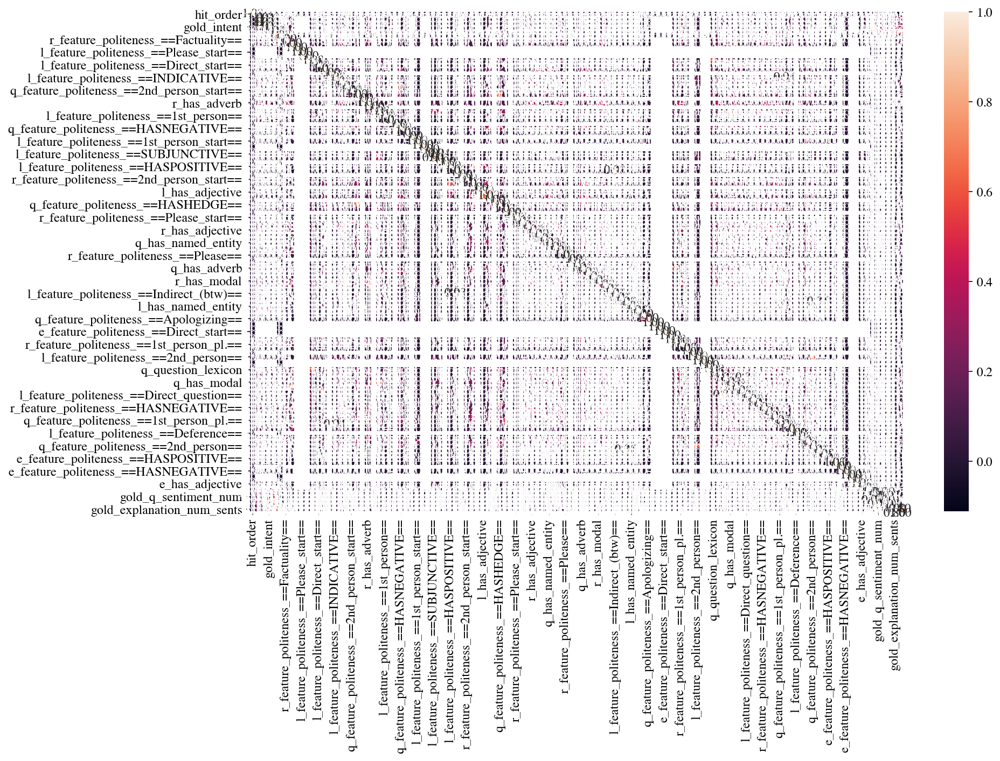

Theil's U


/Users/elisa/anaconda/envs/mturk/lib/python3.7/site-packages/pandas/core/frame.py:4153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  downcast=downcast,


                                              hit_order  gold_coarse_label  \
hit_order                                      1.000000           0.037874   
gold_coarse_label                              0.037874           1.000000   
gold_act                                       0.029416           1.000000   
gold_intent                                    0.037874           1.000000   
gold_worker                                    0.037748           0.030252   
gold_work_time                                 0.009405           0.065962   
r_feature_politeness_==Factuality==            0.001299           0.019986   
r_feature_politeness_==Hedges==                0.016616           0.021482   
e_feature_politeness_==Please==                0.000000           1.000000   
l_feature_politeness_==Please_start==          0.000000           1.000000   
e_feature_politeness_==SUBJUNCTIVE==           0.000000           1.000000   
l_question_lexicon                             0.007899         

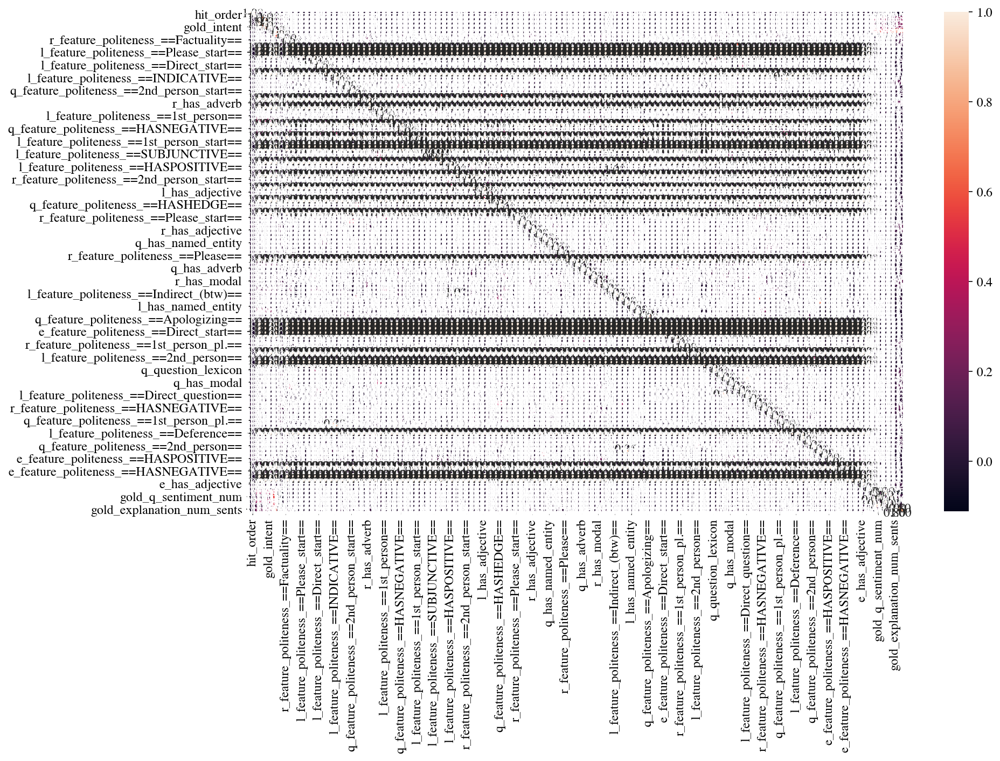

In [127]:
nominal_columns = ['gold_coarse_label', 'gold_act', 'gold_intent', 
       'gold_worker', 
       'r_feature_politeness_==Factuality==',
       'r_feature_politeness_==Hedges==', 'e_feature_politeness_==Please==',
       'l_feature_politeness_==Please_start==',
       'e_feature_politeness_==SUBJUNCTIVE==', 'l_question_lexicon',
       'l_feature_politeness_==Direct_start==', 'q_has_cardinal_num',
                              'e_feature_politeness_==2nd_person==',
       'l_feature_politeness_==INDICATIVE==',
       'r_feature_politeness_==1st_person==',
       'l_feature_politeness_==HASNEGATIVE==',
       'q_feature_politeness_==2nd_person_start==',
       'q_feature_politeness_==Hedges==', 'e_has_cardinal_num', 'r_has_adverb',
       'e_feature_politeness_==Deference==',
                              'l_has_modal',
       'l_feature_politeness_==1st_person==',
       'r_feature_politeness_==SUBJUNCTIVE==',
       'e_feature_politeness_==Apologizing==',
       'q_feature_politeness_==HASNEGATIVE==',
       'r_feature_politeness_==Indirect_(btw)==',
       'e_feature_politeness_==Direct_question==',
       'l_feature_politeness_==1st_person_start==',
       'e_feature_politeness_==2nd_person_start==',
                              'e_feature_politeness_==Factuality==',
       'l_feature_politeness_==SUBJUNCTIVE==',
       'q_feature_politeness_==SUBJUNCTIVE==',
       'e_feature_politeness_==INDICATIVE==',
       'l_feature_politeness_==HASPOSITIVE==',
       'q_feature_politeness_==Indirect_(btw)==',
       'q_feature_politeness_==Indirect_(greeting)==',
       'r_feature_politeness_==2nd_person_start==',
       'q_feature_politeness_==HASPOSITIVE==',
                              'l_feature_politeness_==Indirect_(greeting)==', 'l_has_adjective',
       'q_has_adjective', 'e_feature_politeness_==1st_person_pl.==',
       'q_feature_politeness_==HASHEDGE==',
       'l_feature_politeness_==1st_person_pl.==',
       'r_feature_politeness_==INDICATIVE==',
       'r_feature_politeness_==Please_start==',
       'l_feature_politeness_==2nd_person_start==',
                             'r_feature_politeness_==2nd_person==', 'r_has_adjective',
       'l_has_cardinal_num', 'q_feature_politeness_==Factuality==',
       'q_has_named_entity', 'r_feature_politeness_==Gratitude==',
       'r_question_lexicon', 'r_feature_politeness_==Please==',
       'r_feature_politeness_==Indirect_(greeting)==',
                             'q_feature_politeness_==Please_start==', 'q_has_adverb',
       'q_feature_politeness_==1st_person==',
       'r_feature_politeness_==Deference==', 'r_has_modal',
       'r_feature_politeness_==Direct_start==',
       'l_feature_politeness_==Gratitude==',
       'l_feature_politeness_==Indirect_(btw)==',
       'l_feature_politeness_==Hedges==',
                              'q_feature_politeness_==Please==',
       'l_has_named_entity', 'r_feature_politeness_==Apologizing==',
       'l_feature_politeness_==Apologizing==',
       'q_feature_politeness_==Apologizing==',
       'e_feature_politeness_==1st_person_start==',
       'e_feature_politeness_==Indirect_(btw)==',
       'e_feature_politeness_==Direct_start==',
       'e_feature_politeness_==1st_person==',
                              'l_has_adverb',
       'r_feature_politeness_==1st_person_pl.==',
       'q_feature_politeness_==Deference==',
       'e_feature_politeness_==Indirect_(greeting)==',
       'l_feature_politeness_==2nd_person==',
       'e_feature_politeness_==Gratitude==',
       'e_feature_politeness_==Please_start==', 'q_question_lexicon',
       'r_has_named_entity',
                              'q_feature_politeness_==Direct_question==',
       'q_has_modal', 'r_feature_politeness_==HASHEDGE==',
       'q_feature_politeness_==Direct_start==',
       'l_feature_politeness_==Direct_question==',
       'r_feature_politeness_==Direct_question==',
       'l_feature_politeness_==HASHEDGE==',
       'r_feature_politeness_==HASNEGATIVE==',
       'r_feature_politeness_==HASPOSITIVE==',
                              'q_feature_politeness_==Gratitude==',
       'q_feature_politeness_==1st_person_pl.==',
       'q_feature_politeness_==INDICATIVE==',
       'r_feature_politeness_==1st_person_start==',
       'l_feature_politeness_==Deference==', 'r_has_cardinal_num',
       'q_feature_politeness_==1st_person_start==',
       'q_feature_politeness_==2nd_person==',
       'l_feature_politeness_==Please==',
                              'l_feature_politeness_==Factuality==', 
       'e_feature_politeness_==HASPOSITIVE==',
       'e_has_modal', 'e_question_lexicon',
                              'e_has_named_entity',
       'e_feature_politeness_==HASNEGATIVE==',
       'e_feature_politeness_==Hedges==', 'e_feature_politeness_==HASHEDGE==',
       'e_has_adjective', 'e_has_adverb']

nominal_corr_df = expanded_df[['hit_order','gold_coarse_label', 'gold_act', 'gold_intent', 
       'gold_worker', 'gold_work_time',
       'r_feature_politeness_==Factuality==',
       'r_feature_politeness_==Hedges==', 'e_feature_politeness_==Please==',
       'l_feature_politeness_==Please_start==',
       'e_feature_politeness_==SUBJUNCTIVE==', 'l_question_lexicon',
       'l_feature_politeness_==Direct_start==', 'q_has_cardinal_num',
                              'e_feature_politeness_==2nd_person==',
       'l_feature_politeness_==INDICATIVE==',
       'r_feature_politeness_==1st_person==',
       'l_feature_politeness_==HASNEGATIVE==',
       'q_feature_politeness_==2nd_person_start==',
       'q_feature_politeness_==Hedges==', 'e_has_cardinal_num', 'r_has_adverb',
       'e_feature_politeness_==Deference==',
                              'l_has_modal',
       'l_feature_politeness_==1st_person==',
       'r_feature_politeness_==SUBJUNCTIVE==',
       'e_feature_politeness_==Apologizing==',
       'q_feature_politeness_==HASNEGATIVE==',
       'r_feature_politeness_==Indirect_(btw)==',
       'e_feature_politeness_==Direct_question==',
       'l_feature_politeness_==1st_person_start==',
       'e_feature_politeness_==2nd_person_start==',
                              'e_feature_politeness_==Factuality==',
       'l_feature_politeness_==SUBJUNCTIVE==',
       'q_feature_politeness_==SUBJUNCTIVE==',
       'e_feature_politeness_==INDICATIVE==',
       'l_feature_politeness_==HASPOSITIVE==',
       'q_feature_politeness_==Indirect_(btw)==',
       'q_feature_politeness_==Indirect_(greeting)==',
       'r_feature_politeness_==2nd_person_start==',
       'q_feature_politeness_==HASPOSITIVE==',
                              'l_feature_politeness_==Indirect_(greeting)==', 'l_has_adjective',
       'q_has_adjective', 'e_feature_politeness_==1st_person_pl.==',
       'q_feature_politeness_==HASHEDGE==',
       'l_feature_politeness_==1st_person_pl.==',
       'r_feature_politeness_==INDICATIVE==',
       'r_feature_politeness_==Please_start==',
       'l_feature_politeness_==2nd_person_start==',
                             'r_feature_politeness_==2nd_person==', 'r_has_adjective',
       'l_has_cardinal_num', 'q_feature_politeness_==Factuality==',
       'q_has_named_entity', 'r_feature_politeness_==Gratitude==',
       'r_question_lexicon', 'r_feature_politeness_==Please==',
       'r_feature_politeness_==Indirect_(greeting)==',
                             'q_feature_politeness_==Please_start==', 'q_has_adverb',
       'q_feature_politeness_==1st_person==',
       'r_feature_politeness_==Deference==', 'r_has_modal',
       'r_feature_politeness_==Direct_start==',
       'l_feature_politeness_==Gratitude==',
       'l_feature_politeness_==Indirect_(btw)==',
       'l_feature_politeness_==Hedges==',
                              'q_feature_politeness_==Please==',
       'l_has_named_entity', 'r_feature_politeness_==Apologizing==',
       'l_feature_politeness_==Apologizing==',
       'q_feature_politeness_==Apologizing==',
       'e_feature_politeness_==1st_person_start==',
       'e_feature_politeness_==Indirect_(btw)==',
       'e_feature_politeness_==Direct_start==',
       'e_feature_politeness_==1st_person==',
                              'l_has_adverb',
       'r_feature_politeness_==1st_person_pl.==',
       'q_feature_politeness_==Deference==',
       'e_feature_politeness_==Indirect_(greeting)==',
       'l_feature_politeness_==2nd_person==',
       'e_feature_politeness_==Gratitude==',
       'e_feature_politeness_==Please_start==', 'q_question_lexicon',
       'r_has_named_entity',
                              'q_feature_politeness_==Direct_question==',
       'q_has_modal', 'r_feature_politeness_==HASHEDGE==',
       'q_feature_politeness_==Direct_start==',
       'l_feature_politeness_==Direct_question==',
       'r_feature_politeness_==Direct_question==',
       'l_feature_politeness_==HASHEDGE==',
       'r_feature_politeness_==HASNEGATIVE==',
       'r_feature_politeness_==HASPOSITIVE==',
                              'q_feature_politeness_==Gratitude==',
       'q_feature_politeness_==1st_person_pl.==',
       'q_feature_politeness_==INDICATIVE==',
       'r_feature_politeness_==1st_person_start==',
       'l_feature_politeness_==Deference==', 'r_has_cardinal_num',
       'q_feature_politeness_==1st_person_start==',
       'q_feature_politeness_==2nd_person==',
       'l_feature_politeness_==Please==',
                              'l_feature_politeness_==Factuality==', 
       'e_feature_politeness_==HASPOSITIVE==',
       'e_has_modal', 'e_question_lexicon',
                              'e_has_named_entity',
       'e_feature_politeness_==HASNEGATIVE==',
       'e_feature_politeness_==Hedges==', 'e_feature_politeness_==HASHEDGE==',
       'e_has_adjective', 'e_has_adverb',  'gold_sentiment_num',
                             'gold_q_sentiment_num',
       'gold_sentiment_coarse_num', 'gold_q_sentiment_coarse_num',
       'gold_explanation_num_sents',
       'gold_explanation_len']]
nominal_corr_df.reset_index(inplace=True,drop=True)
get_correlations(nominal_corr_df, nominal_columns=nominal_columns)

Cramer's V


/Users/elisa/anaconda/envs/mturk/lib/python3.7/site-packages/pandas/core/frame.py:4153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  downcast=downcast,
/Users/elisa/anaconda/envs/mturk/lib/python3.7/site-packages/dython/nominal.py:102: RuntimeWarning: invalid value encountered in double_scalars
  return np.sqrt(phi2corr / min((kcorr - 1), (rcorr - 1)))
/Users/elisa/anaconda/envs/mturk/lib/python3.7/site-packages/dython/nominal.py:102: RuntimeWarning: divide by zero encountered in double_scalars
  return np.sqrt(phi2corr / min((kcorr - 1), (rcorr - 1)))


                                              hearing_id  hearing_title  \
hearing_id                                      1.000000       0.999490   
hearing_title                                   0.999490       1.000000   
qa_index                                             NaN            NaN   
q_speaker                                       0.729421       0.736848   
q_speaker_detail                                0.712863       0.721910   
r_speaker_detail                                0.998981       0.976781   
hit_order                                       0.000000       0.000000   
gold_label_set                                  0.126261       0.123697   
gold_act_set                                    0.186201       0.182493   
gold_intent_set                                 0.126261       0.123697   
r_text_num_sents                                0.435273       0.430107   
r_text_len                                      0.471503       0.461113   
q_text_num_sents         

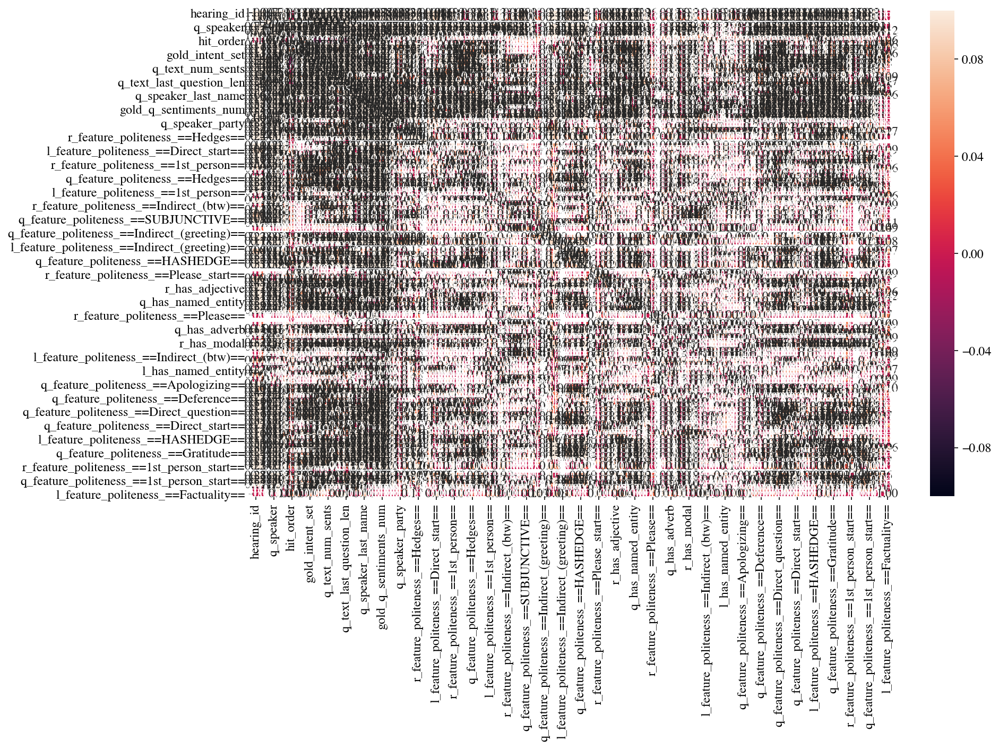

Theil's U


/Users/elisa/anaconda/envs/mturk/lib/python3.7/site-packages/pandas/core/frame.py:4153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  downcast=downcast,


                                              hearing_id  hearing_title  \
hearing_id                                      1.000000       0.976862   
hearing_title                                   1.000000       1.000000   
qa_index                                        0.433677       0.423642   
q_speaker                                       0.569111       0.558176   
q_speaker_detail                                0.562241       0.553559   
r_speaker_detail                                1.000000       0.975740   
hit_order                                       0.000000       0.000000   
gold_label_set                                  0.145170       0.137274   
gold_act_set                                    0.105809       0.101768   
gold_intent_set                                 0.145170       0.137274   
r_text_num_sents                                0.435273       0.430107   
r_text_len                                      0.471503       0.461113   
q_text_num_sents         

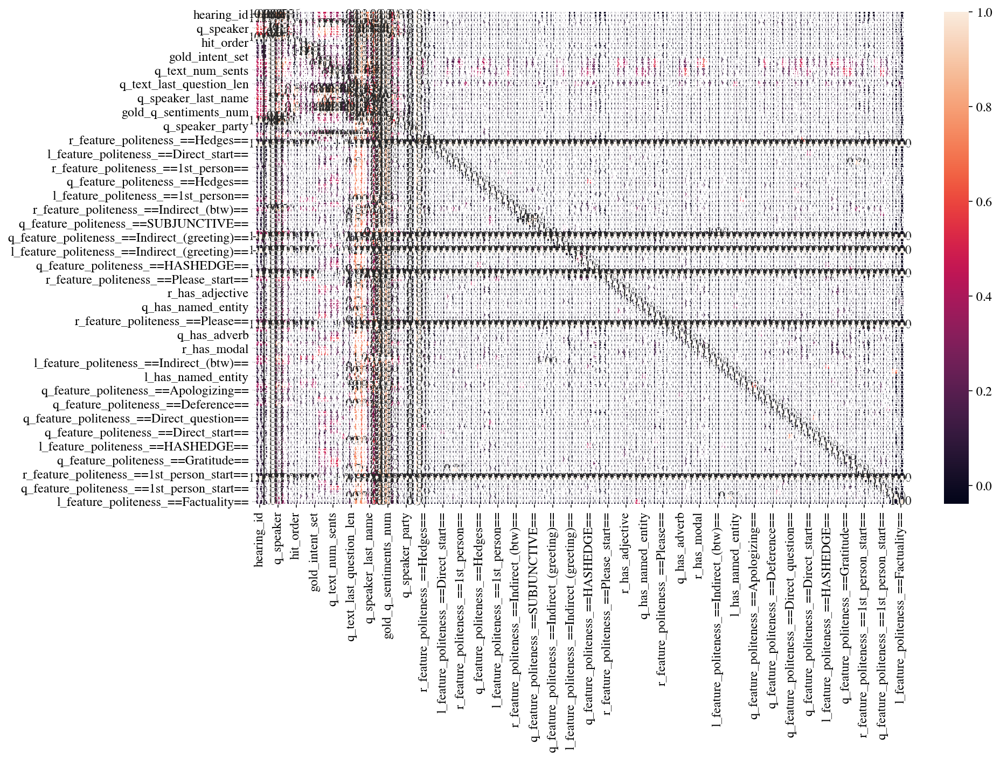

In [145]:
corr_gold_df = gold_df[['hearing_id', 'hearing_title', 'qa_index', 'q_speaker',
       'q_speaker_detail', 'r_speaker_detail', 'hit_order',
        'gold_label_set', 'gold_act_set', 
        'gold_intent_set',
        'r_text_num_sents', 'r_text_len',
        'q_text_num_sents', 'q_text_len', 'question_type',
       'q_text_last_question_len',
       'gold_sentiments_coarse_num',
       'gold_q_sentiments_coarse_num', 
        'q_speaker_last_name', 
        'gold_q_intents_num',
         'gold_sentiments_num', 'gold_q_sentiments_num',
        'q_speaker_role',
       'r_speaker_role', 'q_speaker_party', 
       'r_feature_politeness_==Factuality==',
       'gold_explanation_tokenized', 'r_feature_politeness_==Hedges==',
       #'e_feature_politeness_==Please==', 
       #'e_feature_politeness_==HASHEDGE==',
       'l_feature_politeness_==Please_start==',
       #'e_feature_politeness_==SUBJUNCTIVE==', 
       'l_question_lexicon',
       'l_feature_politeness_==Direct_start==', 'q_has_cardinal_num',
       #'e_feature_politeness_==2nd_person==',
       'l_feature_politeness_==INDICATIVE==',
       'r_feature_politeness_==1st_person==',
       'l_feature_politeness_==HASNEGATIVE==',
       'q_feature_politeness_==2nd_person_start==',
       'q_feature_politeness_==Hedges==', 
       #'e_has_cardinal_num', 
       'r_has_adverb',
       #'e_feature_politeness_==Deference==', 
       'l_has_modal',
       'l_feature_politeness_==1st_person==',
       'r_feature_politeness_==SUBJUNCTIVE==',
       #'e_feature_politeness_==HASPOSITIVE==', 'e_has_adverb',
       #'e_feature_politeness_==Apologizing==',
       'q_feature_politeness_==HASNEGATIVE==',
       'r_feature_politeness_==Indirect_(btw)==',
       #'e_feature_politeness_==Direct_question==',
       'l_feature_politeness_==1st_person_start==',
       #'e_feature_politeness_==HASNEGATIVE==',
       #'e_feature_politeness_==2nd_person_start==',
       #'e_feature_politeness_==Factuality==',
       'l_feature_politeness_==SUBJUNCTIVE==',
       'q_feature_politeness_==SUBJUNCTIVE==',
       #'e_feature_politeness_==INDICATIVE==',
       'l_feature_politeness_==HASPOSITIVE==',
       'q_feature_politeness_==Indirect_(btw)==', 
       #'e_has_adjective',
       'q_feature_politeness_==Indirect_(greeting)==',
       'r_feature_politeness_==2nd_person_start==',
       'q_feature_politeness_==HASPOSITIVE==',
       'l_feature_politeness_==Indirect_(greeting)==', 'l_has_adjective',
       'q_has_adjective', 
       #'e_feature_politeness_==1st_person_pl.==',
       'q_feature_politeness_==HASHEDGE==',
       'l_feature_politeness_==1st_person_pl.==',
       'r_feature_politeness_==INDICATIVE==',
       'r_feature_politeness_==Please_start==',
       'l_feature_politeness_==2nd_person_start==',
       'r_feature_politeness_==2nd_person==', 'r_has_adjective',
       'l_has_cardinal_num', 'q_feature_politeness_==Factuality==',
       'q_has_named_entity', 'r_feature_politeness_==Gratitude==',
       'r_question_lexicon', 'r_feature_politeness_==Please==',
       'r_feature_politeness_==Indirect_(greeting)==',
       'q_feature_politeness_==Please_start==', 'q_has_adverb',
       'q_feature_politeness_==1st_person==',
       'r_feature_politeness_==Deference==', 'r_has_modal',
       'r_feature_politeness_==Direct_start==',
       'l_feature_politeness_==Gratitude==',
       'l_feature_politeness_==Indirect_(btw)==',
       'l_feature_politeness_==Hedges==', 'q_feature_politeness_==Please==',
       'l_has_named_entity', 'r_feature_politeness_==Apologizing==',
       'l_feature_politeness_==Apologizing==',
       'q_feature_politeness_==Apologizing==',
       #'e_feature_politeness_==1st_person_start==',
       #'e_feature_politeness_==Indirect_(btw)==',
       #'e_feature_politeness_==Direct_start==',
       #'e_feature_politeness_==1st_person==',
       #'e_feature_politeness_==Hedges==', 
        'l_has_adverb',
       'r_feature_politeness_==1st_person_pl.==',
       'q_feature_politeness_==Deference==',
       #'e_feature_politeness_==Indirect_(greeting)==',
       'l_feature_politeness_==2nd_person==',
       #'e_feature_politeness_==Gratitude==',
       #'e_feature_politeness_==Please_start==', 'q_question_lexicon',
       'r_has_named_entity', 'q_feature_politeness_==Direct_question==',
       #'e_has_modal', 
       'q_has_modal', 'r_feature_politeness_==HASHEDGE==',
       'q_feature_politeness_==Direct_start==',
       'l_feature_politeness_==Direct_question==',
       'r_feature_politeness_==Direct_question==',
       'l_feature_politeness_==HASHEDGE==',
       'r_feature_politeness_==HASNEGATIVE==',
       'r_feature_politeness_==HASPOSITIVE==',
       'q_feature_politeness_==Gratitude==', #'e_question_lexicon',
       'q_feature_politeness_==1st_person_pl.==',
       'q_feature_politeness_==INDICATIVE==',
       'r_feature_politeness_==1st_person_start==',
       'l_feature_politeness_==Deference==', 'r_has_cardinal_num',
       'q_feature_politeness_==1st_person_start==',
       'q_feature_politeness_==2nd_person==',
       'l_feature_politeness_==Please==',
       'l_feature_politeness_==Factuality=='#, 'e_has_named_entity'
                       ]]
get_correlations(corr_gold_df, nominal_columns=[
    'gold_sentiments_coarse_num','gold_q_sentiments_coarse_num',
    'gold_q_intents_num', 
    'gold_sentiments_num', 'gold_q_sentiments_num',
    'hearing_id', 'hearing_title', 'qa_index', 'q_speaker',
       'q_speaker_detail', 'r_speaker_detail',
       'gold_label_set', 'gold_act_set', 
       'gold_intent_set',
       'question_type',
       'q_speaker_last_name',
       'q_speaker_role',
       'r_speaker_role', 'q_speaker_party', 
       'r_feature_politeness_==Factuality==',
       'gold_explanation_tokenized', 'r_feature_politeness_==Hedges==',
       'e_feature_politeness_==Please==', 'e_feature_politeness_==HASHEDGE==',
       'l_feature_politeness_==Please_start==',
       'e_feature_politeness_==SUBJUNCTIVE==', 'l_question_lexicon',
       'l_feature_politeness_==Direct_start==', 'q_has_cardinal_num',
       'e_feature_politeness_==2nd_person==',
       'l_feature_politeness_==INDICATIVE==',
       'r_feature_politeness_==1st_person==',
       'l_feature_politeness_==HASNEGATIVE==',
       'q_feature_politeness_==2nd_person_start==',
       'q_feature_politeness_==Hedges==', 'e_has_cardinal_num', 'r_has_adverb',
       'e_feature_politeness_==Deference==', 'l_has_modal',
       'l_feature_politeness_==1st_person==',
       'r_feature_politeness_==SUBJUNCTIVE==',
       'e_feature_politeness_==HASPOSITIVE==', 'e_has_adverb',
       'e_feature_politeness_==Apologizing==',
       'q_feature_politeness_==HASNEGATIVE==',
       'r_feature_politeness_==Indirect_(btw)==',
       'e_feature_politeness_==Direct_question==',
       'l_feature_politeness_==1st_person_start==',
                       'e_feature_politeness_==HASNEGATIVE==',
       'e_feature_politeness_==2nd_person_start==',
       'e_feature_politeness_==Factuality==',
       'l_feature_politeness_==SUBJUNCTIVE==',
       'q_feature_politeness_==SUBJUNCTIVE==',
       'e_feature_politeness_==INDICATIVE==',
       'l_feature_politeness_==HASPOSITIVE==',
       'q_feature_politeness_==Indirect_(btw)==', 'e_has_adjective',
       'q_feature_politeness_==Indirect_(greeting)==',
       'r_feature_politeness_==2nd_person_start==',
       'q_feature_politeness_==HASPOSITIVE==',
       'l_feature_politeness_==Indirect_(greeting)==', 'l_has_adjective',
       'q_has_adjective', 'e_feature_politeness_==1st_person_pl.==',
       'q_feature_politeness_==HASHEDGE==',
       'l_feature_politeness_==1st_person_pl.==',
       'r_feature_politeness_==INDICATIVE==',
       'r_feature_politeness_==Please_start==',
       'l_feature_politeness_==2nd_person_start==',
       'r_feature_politeness_==2nd_person==', 'r_has_adjective',
       'l_has_cardinal_num', 'q_feature_politeness_==Factuality==',
       'q_has_named_entity', 'r_feature_politeness_==Gratitude==',
       'r_question_lexicon', 'r_feature_politeness_==Please==',
       'r_feature_politeness_==Indirect_(greeting)==',
       'q_feature_politeness_==Please_start==', 'q_has_adverb',
       'q_feature_politeness_==1st_person==',
       'r_feature_politeness_==Deference==', 'r_has_modal',
       'r_feature_politeness_==Direct_start==',
       'l_feature_politeness_==Gratitude==',
       'l_feature_politeness_==Indirect_(btw)==',
       'l_feature_politeness_==Hedges==', 'q_feature_politeness_==Please==',
       'l_has_named_entity', 'r_feature_politeness_==Apologizing==',
       'l_feature_politeness_==Apologizing==',
       'q_feature_politeness_==Apologizing==',
       'e_feature_politeness_==1st_person_start==',
       'e_feature_politeness_==Indirect_(btw)==',
       'e_feature_politeness_==Direct_start==',
       'e_feature_politeness_==1st_person==',
       'e_feature_politeness_==Hedges==', 'l_has_adverb',
       'r_feature_politeness_==1st_person_pl.==',
       'q_feature_politeness_==Deference==',
       'e_feature_politeness_==Indirect_(greeting)==',
       'l_feature_politeness_==2nd_person==',
       'e_feature_politeness_==Gratitude==',
       'e_feature_politeness_==Please_start==', 'q_question_lexicon',
       'r_has_named_entity', 'q_feature_politeness_==Direct_question==',
       'e_has_modal', 'q_has_modal', 'r_feature_politeness_==HASHEDGE==',
       'q_feature_politeness_==Direct_start==',
       'l_feature_politeness_==Direct_question==',
       'r_feature_politeness_==Direct_question==',
       'l_feature_politeness_==HASHEDGE==',
       'r_feature_politeness_==HASNEGATIVE==',
       'r_feature_politeness_==HASPOSITIVE==',
       'q_feature_politeness_==Gratitude==', 'e_question_lexicon',
       'q_feature_politeness_==1st_person_pl.==',
       'q_feature_politeness_==INDICATIVE==',
       'r_feature_politeness_==1st_person_start==',
       'l_feature_politeness_==Deference==', 'r_has_cardinal_num',
       'q_feature_politeness_==1st_person_start==',
       'q_feature_politeness_==2nd_person==',
       'l_feature_politeness_==Please==',
       'l_feature_politeness_==Factuality=='#, 'e_has_named_entity'
                                               ])

## Q4: How does sentiment change over hearing?

In [146]:
worker_to_color = {}
worker_colors = (plt.get_cmap('tab20b').colors)+(plt.get_cmap('tab20c').colors)+(plt.get_cmap('tab20b').colors+(plt.get_cmap('tab20c').colors))
for idx, worker in enumerate(expanded_df.sort_values(by=['gold_worker'])['gold_worker'].unique()):
    worker_to_color[worker] = worker_colors[idx]
    
def plot_sentiment_time(df, column):        
    n_hearings = len(df['hearing_id'].unique())
    n_cols=4
    n_rows=math.ceil(n_hearings / n_cols)
    fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(12, 8))
    grouped = df.groupby(['hearing_id'])
    row_idx, col_idx = 0, 0
    n_figs = 0
    for name, group in grouped:
        n_figs+=1
        plot_title = name[-5:]+':'+group['hearing_title'].unique()[0][:20]
        subplot_sentiment_time(axes[row_idx, col_idx], group, column, plot_title, worker_to_color)
        # increment counters
        col_idx += 1
        if col_idx >= n_cols:
            col_idx = 0
            row_idx += 1
    fig.tight_layout()
    plt.show()
    
def subplot_sentiment_time(ax, df, column, plot_title, worker_to_color):
    qas = df.sort_values(by=['qa_index'])['qa_index'].unique()
    workers = df['gold_worker'].unique()
    for worker in workers:
        worker_qas = df[df['gold_worker']==worker].sort_values(by=['qa_index'])['qa_index'].unique()
        x = []
        y = []
        for worker_qa in worker_qas:
            x.append(np.where(qas==worker_qa)[0][0])
            y.append(df[(df['gold_worker']==worker) & (df['qa_index']==worker_qa)][column].values[0])
        #print('going to plot x', x, 'and y', y)
        ax.plot(x, y, color=worker_to_color[worker],marker='.')

    #ax.set_yticklabels(range(-3,4,1))
    ax.set_ylim(-4, 4)
    ax.set_title(plot_title)
    ax.set_ylabel('Sentiment')
    #y = [len(labels) for labels in df[column].values]
    #x = range(1,51)
    #ax.plot(x,y,marker='o', linestyle=':')

In [147]:
def plot_sentiment_change_time(df, column):
    n_hearings = len(df['hearing_id'].unique())
    n_cols=4
    n_rows=math.ceil(n_hearings / n_cols)
    fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(12, 8))
    grouped = df.groupby(['hearing_id'])
    row_idx, col_idx = 0, 0
    n_figs = 0
    for name, group in grouped:
        n_figs+=1
        plot_title = name[-5:]+':'+group['hearing_title'].unique()[0][:20]
        #print('hearing', plot_title)
        subplot_sentiment_change_time(axes[row_idx, col_idx], group, column, plot_title, worker_to_color)
        # increment counters
        col_idx += 1
        if col_idx >= n_cols:
            col_idx = 0
            row_idx += 1
    fig.tight_layout()
    plt.show()

workerhearing_to_num_sentiment_changes = collections.defaultdict(int)
workerhearing_to_num_sentiment_flips = collections.defaultdict(int)
def subplot_sentiment_change_time(ax, df, column, plot_title, worker_to_color):
    hearing_id = df['hearing_id'].unique()[0]
    print(hearing_id)
    worker_to_prev_sentiment = {}
    hearing_workers = df['gold_worker'].unique()
    for worker in hearing_workers:
        x=[]
        y=[]
        #print('worker ', worker)
        for idx, qa in enumerate(df.sort_values(by=['qa_index'])['qa_index'].unique()):
            #print('index', idx, 'qa', qa)
            qa_workers = df[df['qa_index']==qa]['gold_worker'].unique()
            curr_sentiment = None
            new_change_count = None
            if worker in qa_workers:
                if worker+':'+hearing_id not in workerhearing_to_num_sentiment_flips:
                    workerhearing_to_num_sentiment_flips[worker+':'+hearing_id]=0
                if worker+':'+hearing_id not in workerhearing_to_num_sentiment_changes:
                    workerhearing_to_num_sentiment_changes[worker+':'+hearing_id]=0
                #print('worker annotated question')
                curr_sentiment = df[(df['gold_worker']==worker) & (df['qa_index']==qa)][column].values[0]
                #print('curr sentiment', curr_sentiment)
                if worker in worker_to_prev_sentiment:
                    #print('worker has prev sent')
                    prev_sentiment = worker_to_prev_sentiment[worker]
                    max_change_count = max((count for count in y if count is not None), default=None)
                    #print('current max change count is', max_change_count)
                    if max_change_count is None:
                        #print('setting max change count to 0 because all None in y')
                        max_change_count = 0
                    if prev_sentiment and prev_sentiment != curr_sentiment:
                        #print('found change in sentiment!')
                        if ('ositive' in prev_sentiment and 'egative' in curr_sentiment) or ('egative' in prev_sentiment and 'ositive' in curr_sentiment):
                            new_change_count = max_change_count + 1
                            workerhearing_to_num_sentiment_flips[worker+':'+hearing_id] += 1
                        else:
                            new_change_count = max_change_count + 0
                            workerhearing_to_num_sentiment_changes[worker+':'+hearing_id] += 1
                    else:
                        new_change_count = max_change_count
                    #print('new change count is now', new_change_count)
                else:
                    #print('worker has no prev sent')
                    new_change_count = 0
                worker_to_prev_sentiment[worker] = curr_sentiment
            else:
                #print('worker did not annotate question')
                new_change_count = None
            x.append(idx)
            #print('added change count value', new_change_count)
            y.append(new_change_count)
        #if '88494' in plot_title:
        #    print('going to plot x', x, 'and y', y)
        ax.plot(x, y, color=worker_to_color[worker],marker='.')
    ax.set_ylim(0, 9)
    ax.set_title(plot_title)
    ax.set_ylabel(r'$\Delta$' ' sentiment')
 

CHRG-113hhrg86195
CHRG-113hhrg88494
CHRG-113hhrg89598
CHRG-113hhrg93834
CHRG-114hhrg20722
CHRG-114hhrg22125
CHRG-114hhrg26003
CHRG-114hhrg95063
CHRG-114hhrg97630
CHRG-115hhrg25545
CHRG-115hhrg30242
CHRG-115hhrg30956
CHRG-115hhrg31349
CHRG-115hhrg31417
CHRG-115hhrg31504
CHRG-115hhrg32380
CHRG-116hhrg35230
CHRG-116hhrg35589
CHRG-116hhrg36001
CHRG-116hhrg37282


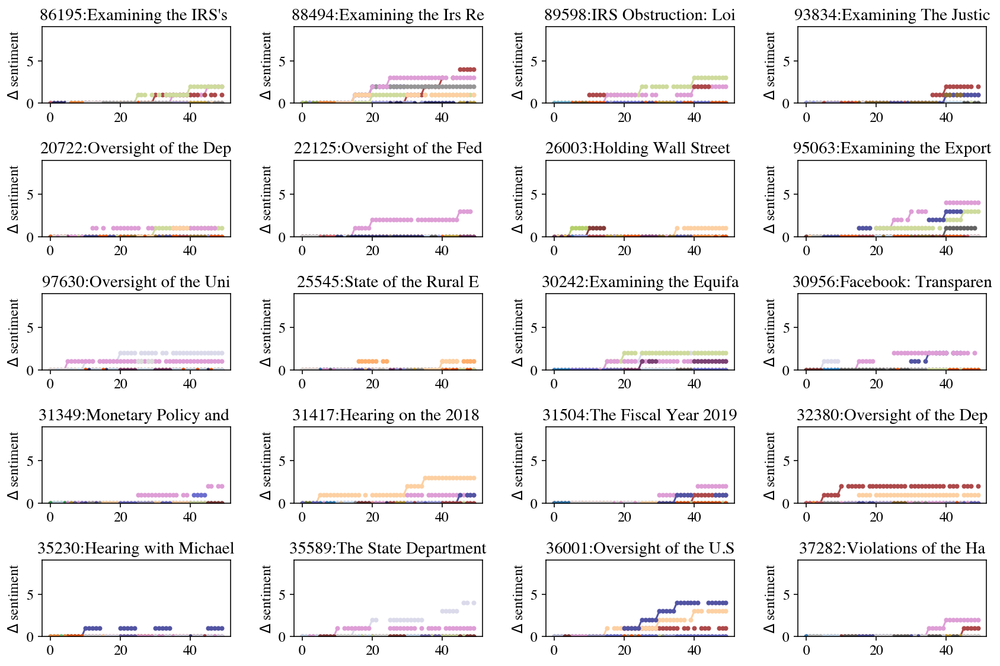

In [148]:
plot_sentiment_change_time(expanded_df, 'gold_sentiment_coarse')

In [ ]:
workerhearing_to_num_sentiment_changes

In [ ]:
workerhearing_to_num_sentiment_flips

In [ ]:
worker_to_num_flips = collections.defaultdict(int)
hearing_to_num_flips = collections.defaultdict(int)
for workerhearing, num_flips in workerhearing_to_num_sentiment_flips.items():
    parts = workerhearing.split(':')
    worker = parts[0]
    hearing = parts[1]
    worker_to_num_flips[worker] += num_flips
    hearing_to_num_flips[hearing] += num_flips
(np.array(list(worker_to_num_flips.values()))>0).sum()

In [ ]:
worker_to_num_changes = collections.defaultdict(int)
hearing_to_num_changes = collections.defaultdict(int)
for workerhearing, num_changes in workerhearing_to_num_sentiment_changes.items():
    parts = workerhearing.split(':')
    worker = parts[0]
    hearing = parts[1]
    worker_to_num_changes[worker] += num_changes
    hearing_to_num_changes[hearing] += num_changes
(np.array(list(worker_to_num_changes.values()))>0).sum()

In [ ]:
#{k: v for k, v in sorted(hearing_to_num_flips.items(), key=lambda item: item[1])}
df_flips = pd.DataFrame(hearing_to_num_flips.items(),columns=['hearing_id','num_flips'])
df_changes = pd.DataFrame(hearing_to_num_changes.items(),columns=['hearing_id','num_changes'])

In [ ]:
df_flips.sort_values(by=['num_flips'])

In [ ]:
df_changes.sort_values(by=['num_changes'])

In [ ]:
direct_answers_series = expanded_df[expanded_df['gold_coarse_label']=='answer'].groupby(['hearing_id'])['qa_index'].count()
flips_answers_df = pd.merge(df_flips, direct_answers_series, left_on='hearing_id', right_index=True)
changes_answers_df = pd.merge(df_changes, direct_answers_series, left_on='hearing_id', right_index=True)

In [ ]:
flips_answers = flips_answers_df[['num_flips','qa_index']].values
changes_answers = changes_answers_df[['num_changes','qa_index']].values

In [ ]:
num_flips, num_answers = list(zip(*flips_answers))
from scipy.stats import pearsonr
pearsonr(num_flips, num_answers)

In [ ]:
num_changes, num_answers = list(zip(*changes_answers))
from scipy.stats import pearsonr
pearsonr(num_changes, num_answers)

In [ ]:
(expanded_df.groupby(['gold_worker'])['gold_hit_id'].count()>5).sum()

In [ ]:
worker_to_hit_ids = expanded_df.groupby(['gold_worker'])['gold_hit_id'].unique().to_dict()
worker_to_num_hits = {}
for worker, hits in worker_to_hit_ids.items():
    worker_to_num_hits[worker] = len(hits)


In [ ]:
worker_to_sent_change_ratio={}
for worker, num_changes in worker_to_num_changes.items():
    worker_to_sent_change_ratio[worker] = num_changes/worker_to_num_hits[worker]

In [ ]:
worker_to_sent_change_ratio

In [ ]:
worker_to_sent_flip_ratio={}
for worker, num_flips in worker_to_num_flips.items():
    worker_to_sent_flip_ratio[worker] = num_flips/worker_to_num_hits[worker]
worker_to_sent_flip_ratio

In [ ]:
plot_sentiment_time(expanded_df, 'gold_sentiment_coarse_num')

In [ ]:
plot_sentiment_time(expanded_df, 'gold_sentiment_num')

In [ ]:
plot_sentiment_time(expanded_df, 'gold_q_sentiment_coarse_num')

In [ ]:
plot_sentiment_time(expanded_df, 'gold_q_sentiment_num')

## Q5: Are there words indicative of labels?

In [ ]:
class PmiLmiCalculator(object):
    def __init__(self):
        self.label_to_counts = {}
        self.word_to_index = {}
        self.all_counts = {}
        self.vectorizer = None
        
    def get_highest_pmi_lmi(self, df, text_column, label_column, label, save_file, n_gram, min_freq, top_k=20):
        print('Calculating PMI and LMI for label', label, 'with ngram', n_gram, 'min freq', min_freq)
        self.set_all_counts_and_index(df, text_column, n_gram, min_freq)
        self.set_label_counts(df, text_column, label_column, label)
        matrix_pmi, matrix_lmi = self.calculate_pmi_lmi(self.label_to_counts[label])

        sorted_pmi = np.array(np.argsort(matrix_pmi)).reshape(-1, )  # from lowest to highest
        sorted_pmi = sorted_pmi[::-1]  # reverse, from highest to lowest
        sorted_pmi_words = [self.lookup_value(self.word_to_index, index) for index in sorted_pmi]
        sorted_pmi_scores = np.array(matrix_pmi[0,sorted_pmi]).reshape(-1, )*10**4
        sorted_pmi_freqs = np.array(self.label_to_counts[label][:,sorted_pmi].sum(axis=0)).reshape(-1,)
        sorted_pmi_tuples = list(zip(sorted_pmi_scores, sorted_pmi_words, sorted_pmi_freqs))
        with open(save_file+'_pmi.csv','w') as out:
            csv_out=csv.writer(out)
            csv_out.writerow(['pmi_score','word', 'frequency'])
            for row in sorted_pmi_tuples:
                csv_out.writerow(row)
        print('Saved PMI scores to ', save_file+'_pmi.csv')

        top_k_pmi_words = sorted_pmi_tuples[:top_k]

        sorted_lmi = np.array(np.argsort(matrix_lmi)).reshape(-1, )  # from lowest to highest
        sorted_lmi = sorted_lmi[::-1]  # reverse, from highest to lowest
        sorted_lmi_words = [self.lookup_value(self.word_to_index, index) for index in sorted_lmi]
        sorted_lmi_scores = np.array(matrix_lmi[0,sorted_lmi]).reshape(-1, )*10**4
        sorted_lmi_freqs = np.array(self.label_to_counts[label][:,sorted_lmi].sum(axis=0)).reshape(-1,)
        sorted_lmi_tuples = list(zip(sorted_lmi_scores, sorted_lmi_words, sorted_lmi_freqs))
        # move nan's to the end of the list
        sorted_lmi_tuples = sorted(sorted_lmi_tuples, key=lambda x: np.isnan(x[0])) 

        with open(save_file+'_lmi.csv','w') as out:
            csv_out=csv.writer(out)
            csv_out.writerow(['lmi_score','word', 'frequency'])
            for row in sorted_lmi_tuples:
                csv_out.writerow(row)
        print('Saved LMI scores to ', save_file+'_lmi.csv')
        top_k_lmi_words = sorted_lmi_tuples[:top_k]

        return top_k_pmi_words, top_k_lmi_words

    def lookup_value(self, _dict, _value):
        return next(key for key, value in _dict.items() if value == _value)

    def set_all_counts_and_index(self, df, text_column, n_gram, min_freq):
        print('inside set')
        if not self.word_to_index:
            print('Creating counter for words...')
            vocab_vectorizer = CountVectorizer(ngram_range=(n_gram, n_gram), tokenizer=tokenize_text, 
                                               min_df=min_freq)#token_pattern='*', 
            vocab_vectorizer.fit_transform(df[text_column].values)
            fixed_vocab = list(vocab_vectorizer.vocabulary_.keys())
            self.vectorizer = CountVectorizer(ngram_range=(n_gram, n_gram), tokenizer=tokenize_text, 
                                         vocabulary=fixed_vocab, #token_pattern='*', 
                                         lowercase=False, min_df=min_freq)
            self.all_counts = self.vectorizer.fit_transform(df[text_column].values)
            self.word_to_index = self.vectorizer.vocabulary_
            print('Created counter for all words with vocab of size', len(self.word_to_index.keys()))

    def set_label_counts(self, df, text_column, label_column, label):
        if label not in self.label_to_counts:
            print('Getting word counts for label...')
            label_counts = self.vectorizer.fit_transform(df[df[label_column]==label][text_column].values) 
            self.label_to_counts[label] = label_counts

    # p (w,l) = count(w,l) / |D|
    # p(l) = count(l) / |D|
    # p (l|w) = count(w,l) / count(w)
    # PMI = log ( p(l|w) / p(l) )
    # LMI = p(w, l) · PMI
    def calculate_pmi_lmi(self, label_counts):
        count_word_label = label_counts.sum(axis=0)
        count_label = np.sum(label_counts)
        count_word =self.all_counts.sum(axis=0)
        D = np.sum(self.all_counts)

        prob_word_label = count_word_label / D
        prob_label_word = count_word_label / count_word
        prob_label = count_label / D

        # divide prob label given word by prob label
        pmi_matrix = prob_label_word / prob_label

        # take log -- this will generate a divide by zero warning because we are taking log of 0
        pmi_matrix = np.log(pmi_matrix) 
        # pmi_matrix = np.maximum(pmi_matrix, 0) # log(0)=-inf so sub this with 0

        # multiply by prob word and label
        lmi_matrix = np.multiply(prob_word_label, pmi_matrix)
        print("Calculated lmi matrix: ", lmi_matrix.shape)
        return pmi_matrix, lmi_matrix

### Cue words in response

In [ ]:
ngrams = [1, 2, 3]
minfreqs = [5]
label_column = 'gold_label_set'
text_column = 'r_text'
df = gold_df
for ngram in ngrams:
    for minfreq in minfreqs:
        pmiLmiCalc = PmiLmiCalculator()
        for label_set in df[label_column].unique():
            label_set_name = '+'.join(label_set)
            save_file = os.path.join('../../data/analyses','lmi_pmi_response','label_sets',label_set_name+'_ngram'+str(ngram)+'_minfreq'+str(minfreq))
            pmiLmiCalc.get_highest_pmi_lmi(df, text_column, label_column, label_set, save_file, n_gram=ngram, min_freq=minfreq, top_k=50)

In [ ]:
ngrams = [1, 2, 3]
minfreqs = [5]
label_column = 'gold_coarse_label'
text_column = 'r_text'
df = expanded_ling_df
for ngram in ngrams:
    for minfreq in minfreqs:
        pmiLmiCalc = PmiLmiCalculator()
        for label in df[label_column].unique():
            save_file = os.path.join('../../data/analyses','lmi_pmi_response','labels',label+'_ngram'+str(ngram)+'_minfreq'+str(minfreq))
            pmiLmiCalc.get_highest_pmi_lmi(df, text_column, label_column, label, save_file, n_gram=ngram, min_freq=minfreq, top_k=50)

### Cue words in question

In [ ]:
ngrams = [1, 2, 3]
minfreqs = [5]
label_column = 'gold_coarse_label'
text_column = 'q_text'
df = expanded_ling_df
for ngram in ngrams:
    for minfreq in minfreqs:
        pmiLmiCalc = PmiLmiCalculator()
        for label in ['cant-answer-sincere']:#df[label_column].unique():
            save_file = os.path.join('../../data/analyses','lmi_pmi_question','labels',label+'_ngram'+str(ngram)+'_minfreq'+str(minfreq))
            pmiLmiCalc.get_highest_pmi_lmi(df, text_column, label_column, label, save_file, n_gram=ngram, min_freq=minfreq, top_k=50)

### Cue words in explanation

In [ ]:
ngrams = [1, 2, 3]
minfreqs = [5]
label_column = 'gold_coarse_label'
text_column = 'gold_explanation'
df = expanded_ling_df
for ngram in ngrams:
    for minfreq in minfreqs:
        pmiLmiCalc = PmiLmiCalculator()
        for label in df[label_column].unique():
            save_file = os.path.join('../../data/analyses','lmi_pmi_explanation','labels',label+'_ngram'+str(ngram)+'_minfreq'+str(minfreq))
            pmiLmiCalc.get_highest_pmi_lmi(df, text_column, label_column, label, save_file, n_gram=ngram, min_freq=minfreq, top_k=50)

### Get corpus statistics

In [ ]:
expanded_df[['r_text_len','q_text_len','gold_explanation_len']].describe()

In [ ]:
expanded_df[expanded_df['r_text_len']==1][['qa_index','r_text','gold_coarse_label']]

In [ ]:
expanded_df.groupby(['gold_coarse_label'])[['r_text_len','q_text_len','gold_explanation_len']].describe()

In [ ]:
expanded_df[['r_text_num_sents','q_text_num_sents','gold_explanation_num_sents']].describe()

In [ ]:
expanded_df.groupby(['gold_coarse_label'])[['r_text_num_sents','q_text_num_sents','gold_explanation_num_sents']].describe()

### Incongruous sentiment and label

In [ ]:
gold_df['gold_sentiments_string']=gold_df['gold_sentiments'].astype(str)

In [ ]:
gold_df[~(gold_df['gold_label_set']==tuple(['answer'])) & (gold_df['entropy']==0) & (gold_df['gold_sentiments_string'].str.contains('ositive')) & (gold_df['gold_sentiments_string'].str.contains('egative'))]

In [ ]:
len(gold_df[(gold_df['gold_label_set']==tuple(['answer'])) & (gold_df['entropy']==0) & (gold_df['gold_sentiments_string'].str.contains('ositive')) & (gold_df['gold_sentiments_string'].str.contains('egative'))])

In [ ]:
gold_df[gold_df['gold_label_set']==tuple(['cant-answer-lying'])]

In [ ]:
entropy_values = gold_df.sort_values(by=['entropy'])['entropy'].unique()

In [ ]:
entropy_dfs = []
entropy_mean_dfs = []
for entropy_value in entropy_values:
    entropy_df = gold_df[gold_df['entropy']==entropy_value]
    entropy_mean_dfs.append(entropy_df.mean())
    entropy_dfs.append(entropy_df)

In [ ]:
# single label: 100 vs 0
entropy_dfs[0][['qa_index','gold_label_set','gold_coarse_labels']]

In [ ]:
# 2 labels: 71% vs. 29% (5 vs. 2)
entropy_dfs[1][['qa_index','gold_label_set','gold_coarse_labels']]

In [ ]:
# 2 labels: 60% vs. 40% (3 vs. 2)
entropy_dfs[3][['qa_index','gold_label_set','gold_coarse_labels']]

In [ ]:
# 2 labels: 57% vs. 43% (4 vs. 3)
entropy_dfs[4][['qa_index','gold_label_set','gold_coarse_labels']]

In [ ]:
# 2 labels: 50% vs. 50% (3 vs. 3)
entropy_dfs[5][['qa_index','gold_label_set','gold_coarse_labels']]

In [ ]:
# 3 labels: 43% vs. 29% vs. 29% (3 vs. 2 vs. 2)
entropy_dfs[6][['qa_index','gold_label_set','gold_coarse_labels']]

In [ ]:
# 3 labels: 33% vs. 33% vs. 33% (2 vs. 2 vs. 2)
display(entropy_dfs[7][['qa_index','gold_label_set','gold_coarse_labels']])